Collected 14 martensite histograms
Collected 9 bainite histograms


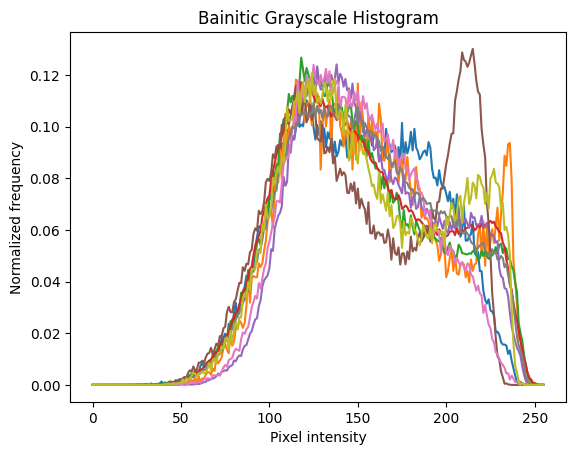

In [ ]:
import cv2
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

segment_dir = 'output_segments'


# Initialize dictionaries to hold histograms per category
histograms = {
    'martensite': [],
    'bainite': []
}

# Get all segment images
segment_files = glob.glob(os.path.join(segment_dir, '*.png'))

for seg_path in segment_files:
    filename = os.path.basename(seg_path)
    # Assuming filename pattern: base_label_index.png
    # Extract label by splitting on underscores
    parts = filename.split('_')
    if len(parts) < 3:
        print(f"Skipping unrecognized filename format: {filename}")
        continue

    label = parts[-2].lower()  # second last part is label

    if label not in histograms:
        print(f"Skipping unknown label '{label}' in file {filename}")
        continue

    # Read image
    img = cv2.imread(seg_path)
    if img is None:
        print(f"Could not read image: {seg_path}")
        continue

    # # Calculate histogram for each channel (B, G, R)
    # hist_b = cv2.calcHist([img], [0], None, [256], [0, 256])
    # hist_g = cv2.calcHist([img], [1], None, [256], [0, 256])
    # hist_r = cv2.calcHist([img], [2], None, [256], [0, 256])

    # # Normalize histograms
    # hist_b = cv2.normalize(hist_b, hist_b).flatten()
    # hist_g = cv2.normalize(hist_g, hist_g).flatten()
    # hist_r = cv2.normalize(hist_r, hist_r).flatten()

    # # Combine histograms into one feature vector (optional)
    # hist_combined = np.concatenate([hist_b, hist_g, hist_r])

    # histograms[label].append(hist_combined)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Calculate grayscale histogram
    hist = cv2.calcHist([gray], [0], None, [256], [1, 256])

    # Normalize histogram
    hist = cv2.normalize(hist, hist).flatten()

    stats_src[label].append(hist)

print(f"Collected {len(stats_src['martensite'])} martensite stats_src")
print(f"Collected {len(stats_src['bainite'])} bainite histograms")

# Example: Plot average histogram of martensite blue channel
for hist in histograms["bainite"]:
    # avg_hist_b = np.mean([h[:256] for h in histograms['martensite']], axis=0)
    # plt.plot(avg_hist_b, color='blue')
    # plt.title('Average Martensite Blue Channel Histogram')
    # plt.show()

    # avg_hist = np.mean(histograms['martensite'], axis=0)
    plt.plot(hist)
    plt.title('Bainitic Grayscale Histogram')
    plt.xlabel('Pixel intensity')
    plt.ylabel('Normalized frequency')
plt.show()


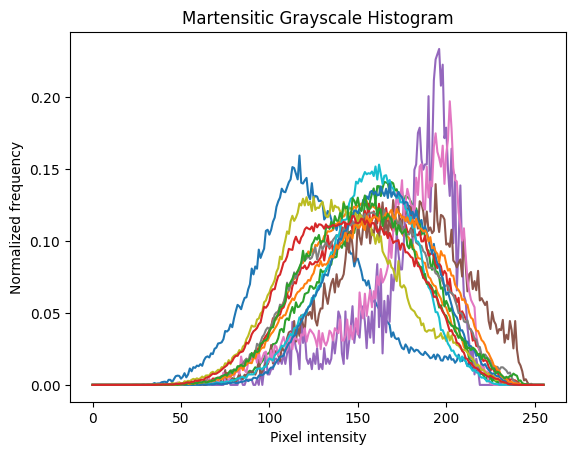

In [2]:
# Example: Plot average histogram of martensite blue channel
for hist in histograms["martensite"]:
    # avg_hist_b = np.mean([h[:256] for h in histograms['martensite']], axis=0)
    # plt.plot(avg_hist_b, color='blue')
    # plt.title('Average Martensite Blue Channel Histogram')
    # plt.show()

    # avg_hist = np.mean(histograms['martensite'], axis=0)
    plt.plot(hist)
    plt.title('Martensitic Grayscale Histogram')
    plt.xlabel('Pixel intensity')
    plt.ylabel('Normalized frequency')
plt.show()

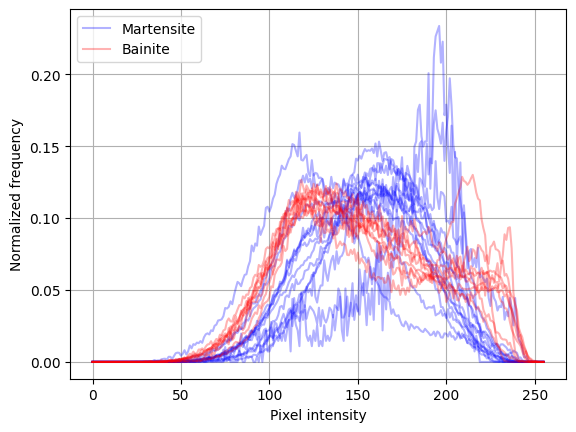

In [27]:
# Plot all martensite histograms in blue with some transparency
for hist in histograms['martensite']:
    plt.plot(hist, color='blue', alpha=0.3, label='Martensite' if 'Martensite' not in plt.gca().get_legend_handles_labels()[1] else "")

# Plot all bainite histograms in red with some transparency
for hist in histograms['bainite']:
    plt.plot(hist, color='red', alpha=0.3, label='Bainite' if 'Bainite' not in plt.gca().get_legend_handles_labels()[1] else "")

# plt.title('Grayscale Histograms of Martensite and Bainite Segments')
plt.xlabel('Pixel intensity')
plt.ylabel('Normalized frequency')
plt.legend()
plt.grid(True)
plt.show()

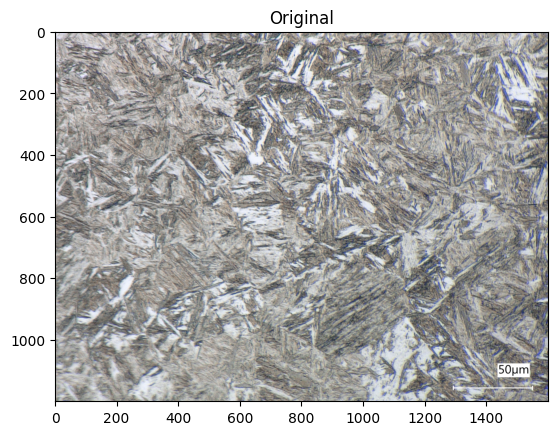

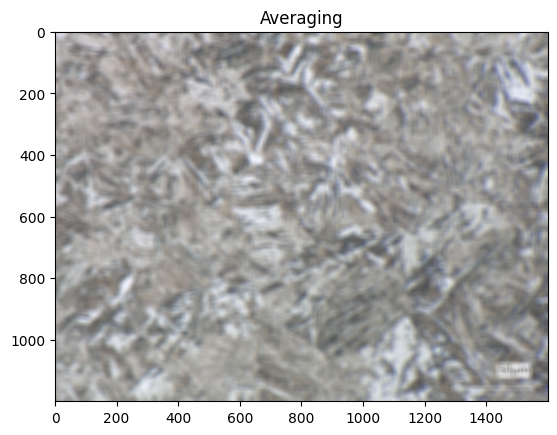

In [252]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
 
dir = 'data_labeling\\src\\raw_images'
segment_files = glob.glob(os.path.join(dir, '*.tif'))
img = io.imread(segment_files[1])

# kernel = np.ones((5,5),np.float32)/25
# dst = cv.filter2D(img,-1,kernel)
blur = cv.blur(img,(20,20))
 
plt.imshow(img),plt.title('Original')
plt.show()
plt.imshow(blur),plt.title('Averaging')
plt.show()

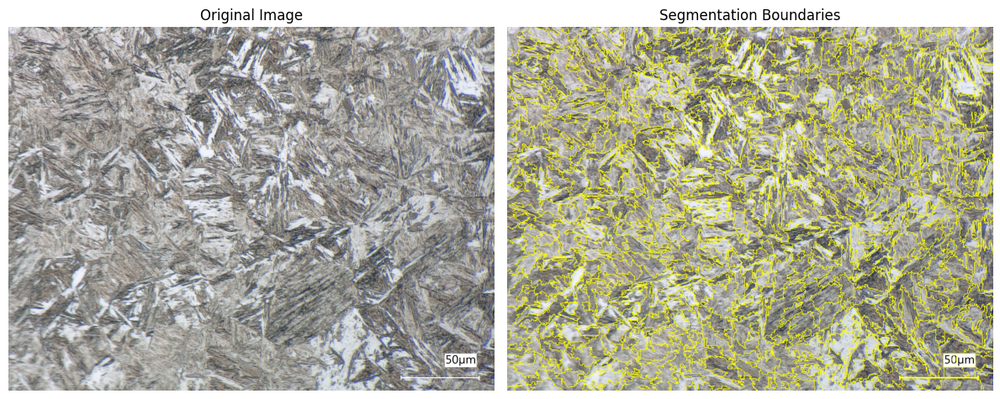

In [267]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb, mark_boundaries
from skimage import io
from skimage.util import img_as_float

segments = felzenszwalb(
    img,
    scale=300,
    sigma=0.2,
    min_size=250
)

# --- Create boundaries overlay ---
boundaries = mark_boundaries(img, segments)

# DISPLAY RESULTS
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Segmentation Boundaries")
plt.imshow(boundaries)
plt.axis("off")

plt.tight_layout()
plt.show()

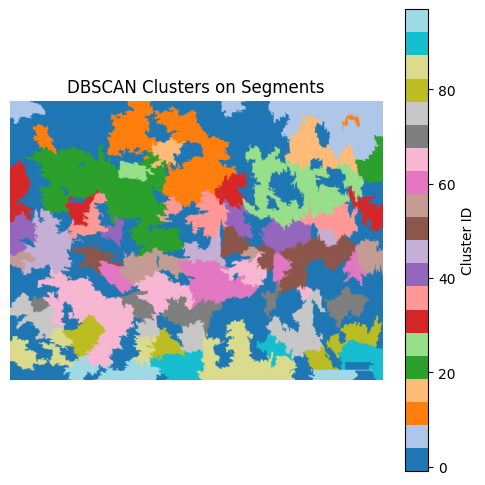

In [269]:
import numpy as np

segment_ids = np.unique(segments)

centroids = []
seg_id_list = []

for seg_id in segment_ids:
    ys, xs = np.where(segments == seg_id)
    if len(xs) == 0:
        continue

    cx = xs.mean()
    cy = ys.mean()

    centroids.append([cx, cy])
    seg_id_list.append(seg_id)

centroids = np.array(centroids)

from sklearn.cluster import DBSCAN

dbscan = DBSCAN(
    eps=40,          # distance between segments
    min_samples=3    # minimum neighboring segments
)

labels = dbscan.fit_predict(centroids)
cluster_img = np.full(segments.shape, -1, dtype=np.int32)

for seg_id, label in zip(seg_id_list, labels):
    cluster_img[segments == seg_id] = label
import matplotlib.pyplot as plt
import matplotlib.cm as cm

plt.figure(figsize=(6, 6))
plt.imshow(cluster_img, cmap="tab20")
plt.title("DBSCAN Clusters on Segments")
plt.axis("off")
plt.colorbar(label="Cluster ID")
plt.show()


In [264]:
overlay = img.copy()

for label in np.unique(labels):
    if label < 0:
        continue

    mask = cluster_img == label
    overlay[mask] = overlay[mask] * 0.6 + 0.4  # brighten cluster


797-DQ-full_1000x-1_bainite_1.png - Image size: 250x408, SLIC segments: 2


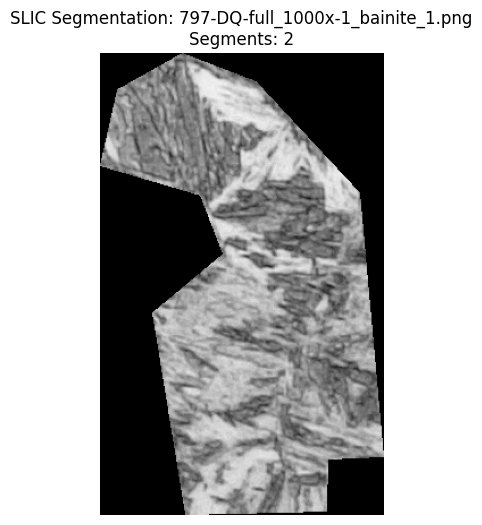

Saved 2 superpixels from 797-DQ-full_1000x-1_bainite_1
797-DQ-full_1000x-1_bainite_2.png - Image size: 231x196, SLIC segments: 2


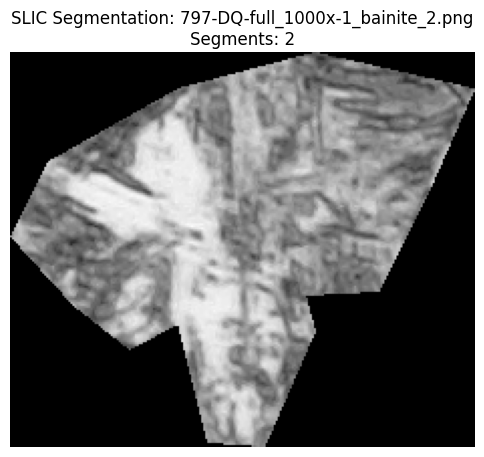

Saved 2 superpixels from 797-DQ-full_1000x-1_bainite_2
797-DQ-full_1000x-1_bainite_3.png - Image size: 585x577, SLIC segments: 6


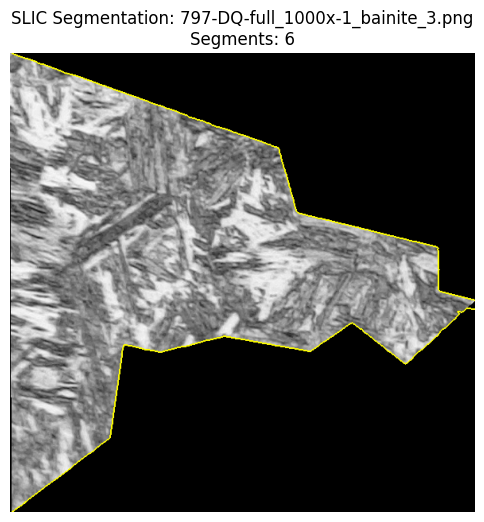

Saved 6 superpixels from 797-DQ-full_1000x-1_bainite_3
797-DQ-full_1000x-1_bainite_4.png - Image size: 1594x1102, SLIC segments: 35


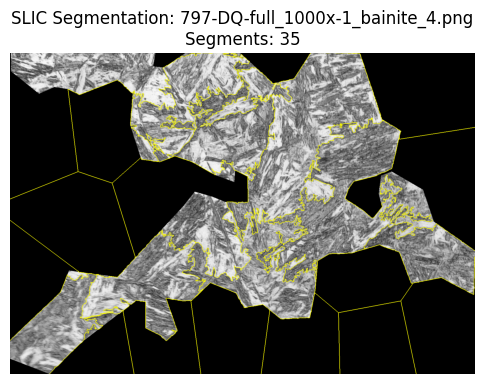

Saved 35 superpixels from 797-DQ-full_1000x-1_bainite_4
797-DQ-full_1000x-1_martensite_1.png - Image size: 300x379, SLIC segments: 2


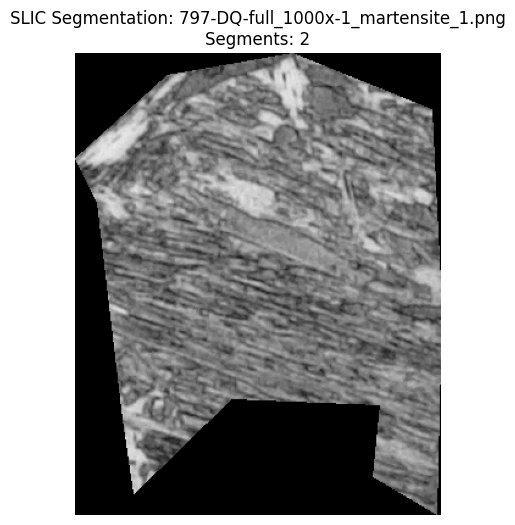

Saved 2 superpixels from 797-DQ-full_1000x-1_martensite_1
797-DQ-full_1000x-1_martensite_2.png - Image size: 1372x530, SLIC segments: 14


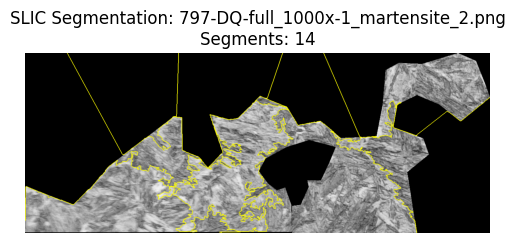

Saved 14 superpixels from 797-DQ-full_1000x-1_martensite_2
797-DQ-full_1000x-1_martensite_3.png - Image size: 503x409, SLIC segments: 4


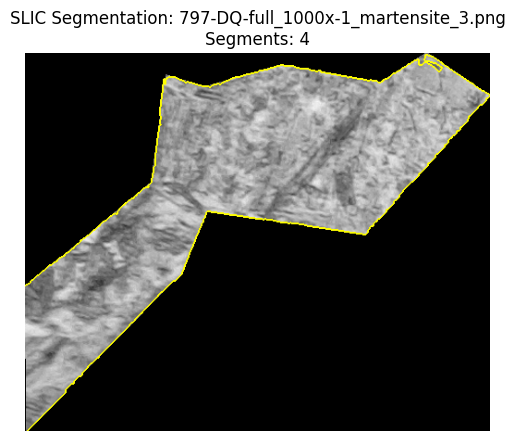

Saved 4 superpixels from 797-DQ-full_1000x-1_martensite_3
797-DQ-full_1000x-1_martensite_4.png - Image size: 815x459, SLIC segments: 7


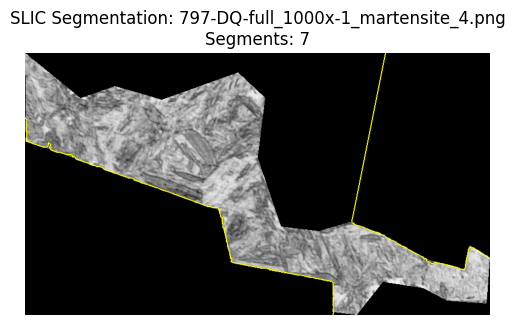

Saved 7 superpixels from 797-DQ-full_1000x-1_martensite_4
797-DQ-full_1000x-1_martensite_5.png - Image size: 83x46, SLIC segments: 2


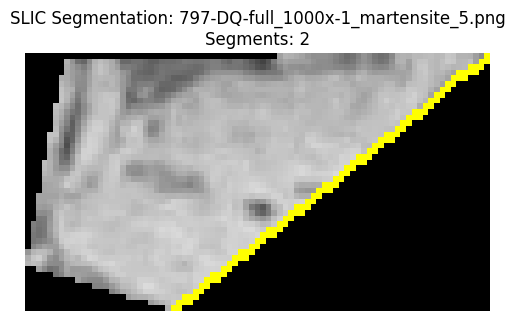

Saved 2 superpixels from 797-DQ-full_1000x-1_martensite_5
797-DQ-full_1000x-1_martensite_6.png - Image size: 234x101, SLIC segments: 2


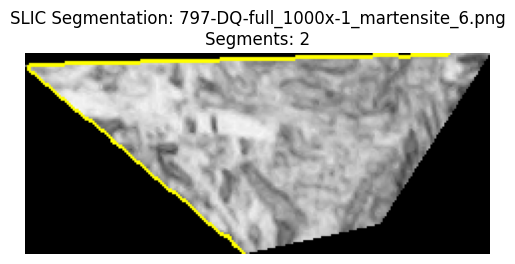

Saved 2 superpixels from 797-DQ-full_1000x-1_martensite_6
797-DQ-full_1000x-1_martensite_7.png - Image size: 125x149, SLIC segments: 2


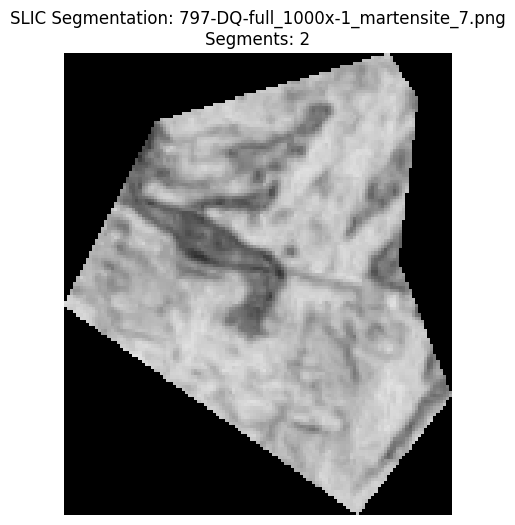

Saved 2 superpixels from 797-DQ-full_1000x-1_martensite_7
797-DQ-full_1000x-1_martensite_8.png - Image size: 395x662, SLIC segments: 5


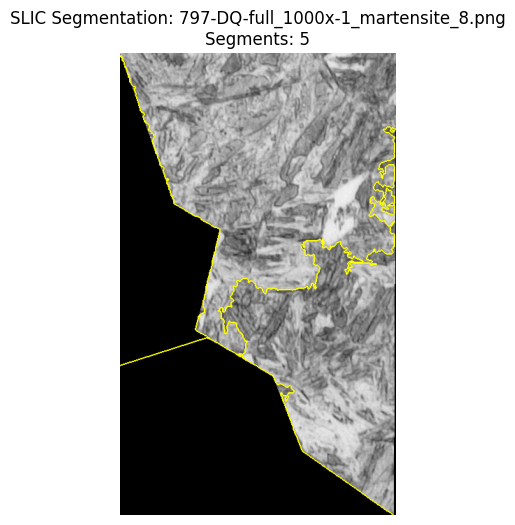

Saved 5 superpixels from 797-DQ-full_1000x-1_martensite_8
797-DQ-full_1000x-2_bainite_1.png - Image size: 642x455, SLIC segments: 5


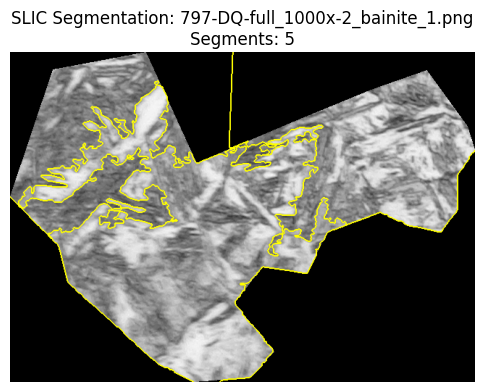

Saved 5 superpixels from 797-DQ-full_1000x-2_bainite_1
797-DQ-full_1000x-2_bainite_2.png - Image size: 427x476, SLIC segments: 4


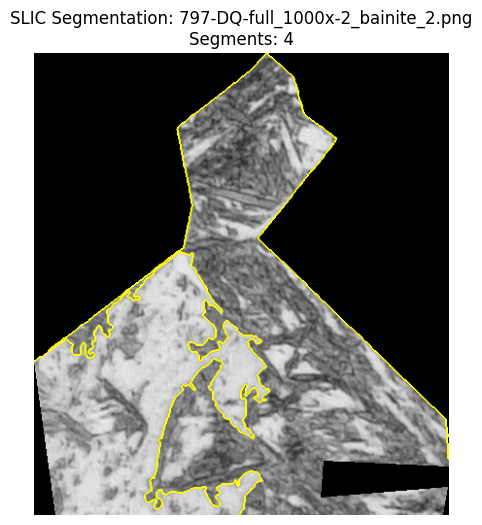

Saved 4 superpixels from 797-DQ-full_1000x-2_bainite_2
797-DQ-full_1000x-2_bainite_3.png - Image size: 556x343, SLIC segments: 3


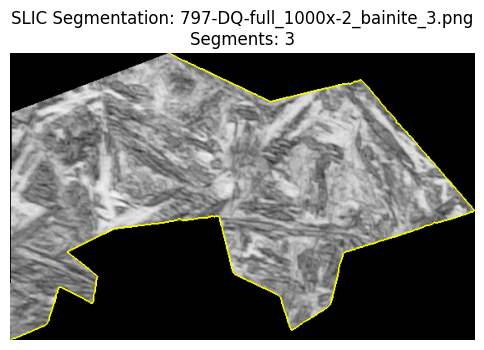

Saved 3 superpixels from 797-DQ-full_1000x-2_bainite_3
797-DQ-full_1000x-2_bainite_4.png - Image size: 822x841, SLIC segments: 13


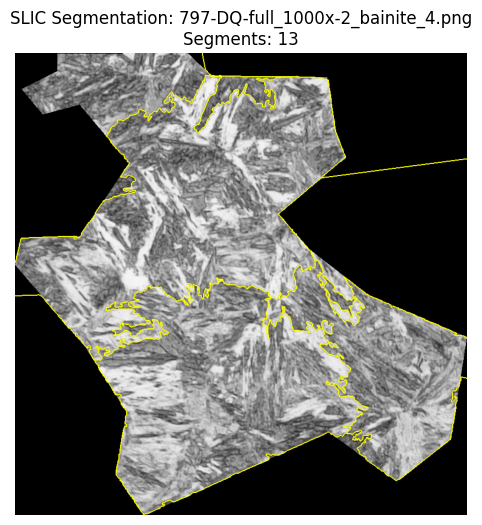

Saved 13 superpixels from 797-DQ-full_1000x-2_bainite_4
797-DQ-full_1000x-2_bainite_5.png - Image size: 282x304, SLIC segments: 2


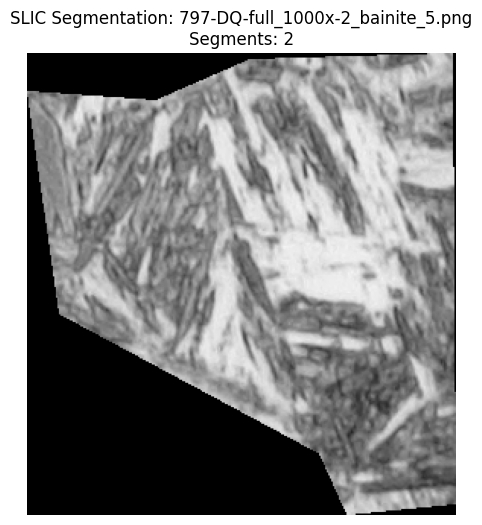

Saved 2 superpixels from 797-DQ-full_1000x-2_bainite_5
797-DQ-full_1000x-2_martensite_1.png - Image size: 416x356, SLIC segments: 2


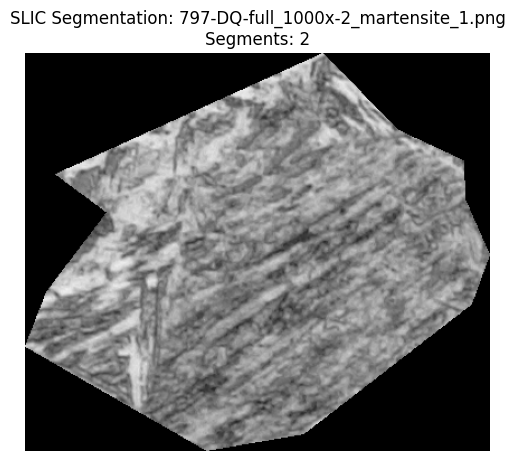

Saved 2 superpixels from 797-DQ-full_1000x-2_martensite_1
797-DQ-full_1000x-2_martensite_2.png - Image size: 665x391, SLIC segments: 5


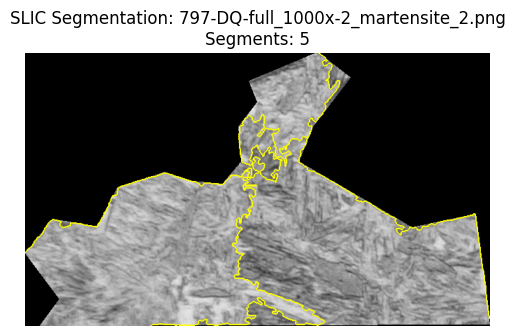

Saved 5 superpixels from 797-DQ-full_1000x-2_martensite_2
797-DQ-full_1000x-2_martensite_3.png - Image size: 628x649, SLIC segments: 8


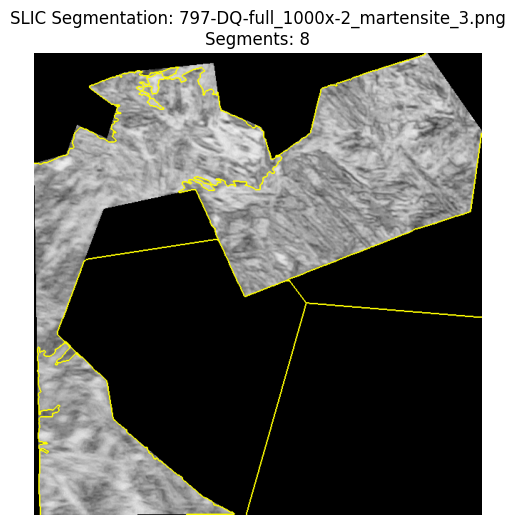

Saved 8 superpixels from 797-DQ-full_1000x-2_martensite_3
797-DQ-full_1000x-2_martensite_4.png - Image size: 627x413, SLIC segments: 5


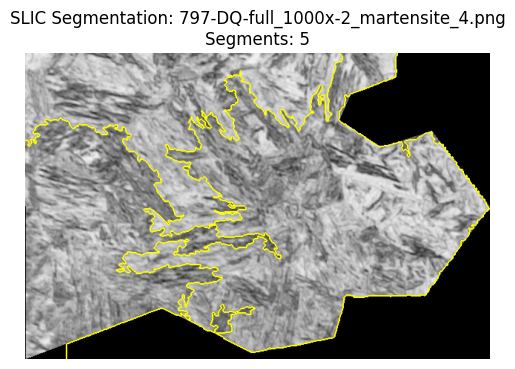

Saved 5 superpixels from 797-DQ-full_1000x-2_martensite_4
797-DQ-full_1000x-2_martensite_5.png - Image size: 844x245, SLIC segments: 4


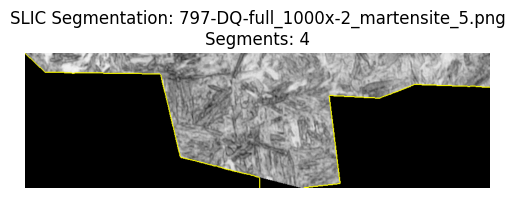

Saved 4 superpixels from 797-DQ-full_1000x-2_martensite_5
797-DQ-full_1000x-2_martensite_6.png - Image size: 668x883, SLIC segments: 11


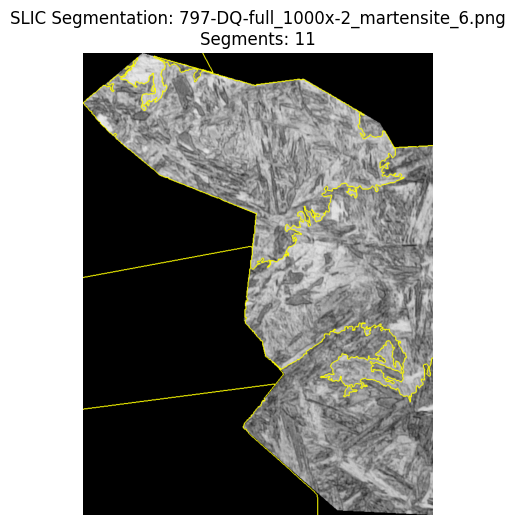

Saved 11 superpixels from 797-DQ-full_1000x-2_martensite_6


In [18]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float

segment_dir = 'output_segments'
output_dir = 'slic_out'
os.makedirs(output_dir, exist_ok=True)
segment_files = glob.glob(os.path.join(segment_dir, '*.png'))

pixels_per_superpixel = 50000  # adjust as needed

for seg_path in segment_files:
    img_bgr = cv2.imread(seg_path)
    if img_bgr is None:
        print(f"Could not read image: {seg_path}")
        continue

    height, width = img_bgr.shape[:2]

    # Convert to grayscale uint8
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # Convert to float for slic (values between 0 and 1)
    img_float = img_as_float(gray)

    num_superpixels = max(2, int((height * width) / pixels_per_superpixel))

    print(f"{os.path.basename(seg_path)} - Image size: {width}x{height}, SLIC segments: {num_superpixels}")

    # Run SLIC on grayscale (2D array), set channel_axis=None explicitly for grayscale images
    segments = slic(img_float, n_segments=num_superpixels, compactness=0.1, sigma=1, start_label=1, channel_axis=None)
    img_with_boundaries = mark_boundaries(img_float, segments)

    plt.figure(figsize=(6, 6))
    plt.imshow(img_with_boundaries, cmap='gray')
    plt.title(f'SLIC Segmentation: {os.path.basename(seg_path)}\nSegments: {num_superpixels}')
    plt.axis('off')
    plt.show()

    base_filename = os.path.splitext(os.path.basename(seg_path))[0]

    MIN_MEAN_INTENSITY = 10  # minimal average pixel value (0-255 scale) to consider "not background"
    MIN_CLUSTER_SIZE = 500

    for sp_label in np.unique(segments):
        mask = (segments == sp_label).astype(np.uint8) * 255

        # Apply mask to grayscale uint8 image
        masked_img = cv2.bitwise_and(gray, gray, mask=mask)

        ys, xs = np.where(mask == 255)
        if len(xs) == 0 or len(ys) == 0:
            continue

        # Skip small clusters
        if len(xs) < MIN_CLUSTER_SIZE:
            continue

        x_min, x_max = xs.min(), xs.max()
        y_min, y_max = ys.min(), ys.max()
        cropped = masked_img[y_min:y_max+1, x_min:x_max+1]

        # Skip clusters that are mostly black background
        mean_intensity = np.mean(cropped)
        if mean_intensity < MIN_MEAN_INTENSITY:
            continue

        out_filename = f"{base_filename}_sp{sp_label}.png"
        out_path = os.path.join(output_dir, out_filename)
        cv2.imwrite(out_path, cropped)

    print(f"Saved {num_superpixels} superpixels from {base_filename}")


['data_labeling\\src\\raw_images\\797-DQ-full_1000x-1.tif', 'data_labeling\\src\\raw_images\\797-DQ-full_1000x-2.tif', 'data_labeling\\src\\raw_images\\797-DQ-full_1000x-3.tif', 'data_labeling\\src\\raw_images\\798-DQ-hollow_1000x-1.tif', 'data_labeling\\src\\raw_images\\798-DQ-hollow_1000x-2.tif', 'data_labeling\\src\\raw_images\\798-DQ-hollow_1000x-3.tif']


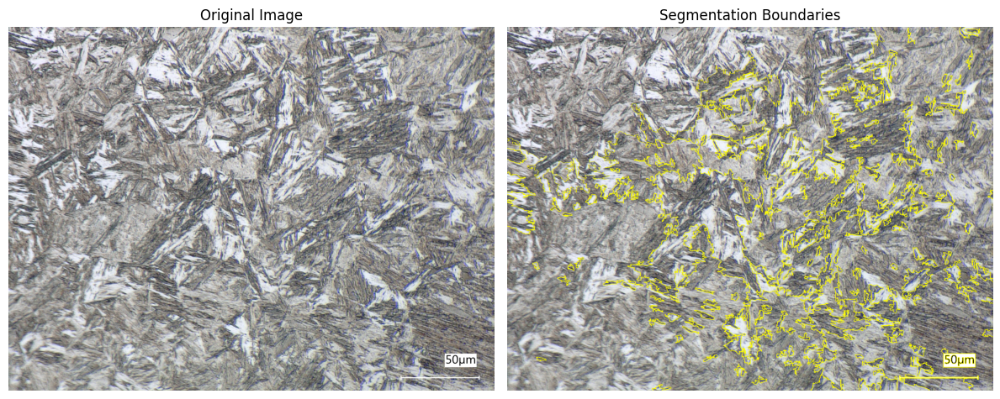

In [ ]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb, mark_boundaries
from skimage import io
from skimage.util import img_as_float

dir = 'data_labeling\\src\\raw_images'
segment_files = glob.glob(os.path.join(dir, '*.tif'))

scale = 35000 
MIN_SIZE = 200

print(segment_files)
for filename in segment_files:
    image = io.imread(filename)
    
    # --- Felzenszwalb segmentation ---
    segments = felzenszwalb(
        image,
        scale=scale,
        sigma=0.1,
        min_size=MIN_SIZE
    )

    # --- Create boundaries overlay ---
    boundaries = mark_boundaries(image, segments)

    # DISPLAY RESULTS
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Segmentation Boundaries")
    plt.imshow(boundaries)
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Loaded 53 samples
Accuracy: 0.9091
              precision    recall  f1-score   support

     Bainite       1.00      0.80      0.89         5
  Martensite       0.86      1.00      0.92         6

    accuracy                           0.91        11
   macro avg       0.93      0.90      0.91        11
weighted avg       0.92      0.91      0.91        11



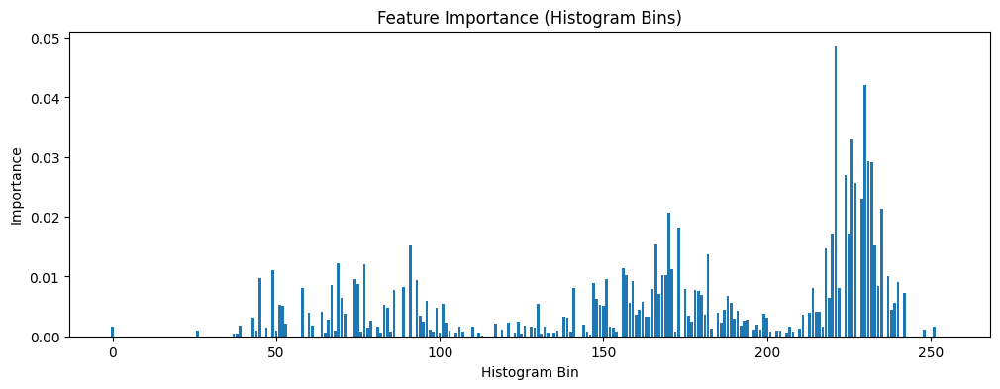

In [ ]:
import os
import glob
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

# Step 1: Load images and labels, compute grayscale histograms

segment_dir = 'slic_out'
histograms = []
labels = []

segment_files = glob.glob(os.path.join(segment_dir, '*.png'))

for seg_path in segment_files:
    filename = os.path.basename(seg_path)
    parts = filename.split('_')
    if len(parts) < 3:
        print(f"Skipping unrecognized filename format: {filename}")
        continue

    label_str = parts[2].lower() # błąd!!! -3!!!

    if label_str not in ['martensite', 'bainite']:
        print(f"Skipping unknown label '{label_str}' in file {filename}")
        continue

    # Map labels to integers
    label = 1 if label_str == 'martensite' else 0

    img = cv2.imread(seg_path)
    if img is None:
        print(f"Could not read image: {seg_path}")
        continue

    # Calculate grayscale values on the fly
    gray_values = (0.114 * img[:, :, 0] + 0.587 * img[:, :, 1] + 0.299 * img[:, :, 2]).astype(np.uint8).flatten()

    # Compute histogram
    hist, _ = np.histogram(gray_values, bins=256, range=(0, 256))

    # Normalize histogram
    hist = hist.astype('float32') / hist.sum()

    histograms.append(hist)
    labels.append(label)

print(f"Loaded {len(histograms)} samples")

# Step 2: Create train/test split
X = np.array(histograms)
y = np.array(labels)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# Step 3: Train Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
#clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(X_train, y_train)

# Step 4: Predict and evaluate
y_pred = clf.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(classification_report(y_test, y_pred, target_names=['Bainite', 'Martensite']))

# Optional: Plot feature importance
plt.figure(figsize=(12, 4))
plt.bar(range(256), clf.feature_importances_)
plt.title('Feature Importance (Histogram Bins)')
plt.xlabel('Histogram Bin')
plt.ylabel('Importance')
plt.show()


In [1]:
from skimage.feature import local_binary_pattern
from skimage import exposure
import numpy as np

def prepare_lbp(img, return_lbp_image=True):
    """
    Prepare LBP for a given image segment.
    
    Parameters
    ----------
    img : 2D ndarray
        Grayscale image patch.
    return_lbp_image : bool
        If True, returns the LBP-transformed image.
        If False, returns recommended LBP parameters (list of (R,P)).
    
    Returns
    -------
    lbp_img : ndarray or lbp_scales : list of tuples
    """
    # Ensure grayscale
    if img.ndim == 3:
        img = img.mean(axis=2).astype(np.uint8)
        
    # Equalize image first
    img_eq = exposure.equalize_adapthist(img)  # float in [0,1]

    # Convert to 8-bit integer (0-255)
    img_eq_uint8 = (img_eq * 255).astype(np.uint8)
    
    # Normalize size-based LBP radius
    h, w = img.shape
    min_side = min(h, w)
    
    # Rule of thumb: radius ≤ 1/8 of patch width
    max_r = max(1, min_side // 8)
    
    # Generate radius list dynamically (1 up to max_r)
    lbp_scales = [(r, r*8) for r in range(1, max_r+1)]
    
    if not return_lbp_image:
        return lbp_scales
    
    # Optional: equalize histogram for better contrast
    img_eq = exposure.equalize_adapthist(img_eq_uint8)
    
    # # Compute multi-scale LBP and stack them
    # lbp_stack = []
    # for R, P in lbp_scales:
    #     lbp = local_binary_pattern(img_eq, P, R, method='uniform')
    #     lbp_stack.append(lbp)
    
    # # Stack along a new axis
    # lbp_img = np.stack(lbp_stack, axis=-1)
    
    hist_all = []
    for R,P in lbp_scales:
        lbp = local_binary_pattern(img_eq_uint8, P, R, method='uniform')
        hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, P+3), density=True)
        hist_all.append(hist)
    lbp_feature = np.concatenate(hist_all)
        
    return lbp_feature


In [2]:
from skimage.feature import local_binary_pattern
from skimage import exposure
import numpy as np
from joblib import Parallel, delayed

def prepare_lbp_parallel(img, return_lbp_image=True, n_jobs=-1, max_radius_cap=4):
    """
    Prepare LBP for a given image segment (parallelized over scales), capped at max_radius_cap.

    Parameters
    ----------
    img : 2D ndarray
        Grayscale image patch.
    return_lbp_image : bool
        If True, returns LBP histogram.
        If False, returns recommended LBP parameters (list of (R,P)).
    n_jobs : int
        Number of parallel jobs. -1 uses all CPUs.
    max_radius_cap : int
        Maximum LBP radius to use (default 4).

    Returns
    -------
    lbp_feature : 1D ndarray of concatenated histograms OR lbp_scales
    """
    # Ensure grayscale
    if img.ndim == 3:
        img = img.mean(axis=2).astype(np.uint8)

    # Equalize image first
    img_eq = exposure.equalize_adapthist(img)  # float in [0,1]

    # Convert to 8-bit integer (0-255)
    img_eq_uint8 = (img_eq * 255).astype(np.uint8)

    # Determine max radius based on patch size, capped by max_radius_cap
    h, w = img.shape
    min_side = min(h, w)
    max_r = min(max_radius_cap, max(1, min_side // 8))
    lbp_scales = [(r, r*8) for r in range(1, max_r+1)]

    if not return_lbp_image:
        return lbp_scales

    # Function to compute histogram for a single scale
    def compute_hist(RP):
        R, P = RP
        lbp = local_binary_pattern(img_eq_uint8, P, R, method='uniform')
        hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, P+3), density=True)
        return hist

    # Parallel computation over scales
    hist_all = Parallel(n_jobs=n_jobs)(
        delayed(compute_hist)(RP) for RP in lbp_scales
    )

    # Concatenate histograms into single feature vector
    lbp_feature = np.concatenate(hist_all)
    return lbp_feature


In [ ]:
import cv2 
img = histograms["bainite"]["img"][0]

# Apply threshold
_, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

cv2.imshow("Thresholded", thresh)
cv2.waitKey(0)
cv2.destroyAllWindows()

# plt.imshow(histograms["bainite"]["img"][0])

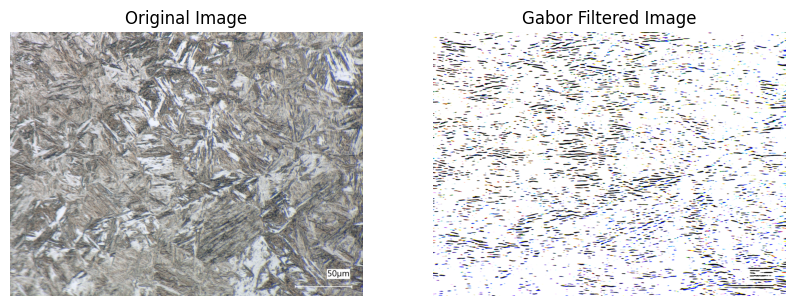

In [7]:
import glob
import os
from skimage import io

dir = 'data_labeling\\src\\raw_images'
segment_files = glob.glob(os.path.join(dir, '*.tif'))
img = io.imread(segment_files[1])

import cv2
import numpy as np
import matplotlib.pyplot as plt


# Define Gabor filter parameters
ksize = 21          # size of the filter (odd number)
sigma = 4.0         # standard deviation of the Gaussian envelope
theta = np.pi / 2   # orientation of the normal to the parallel stripes
lambd = 10.0        # wavelength of the sinusoidal factor
gamma = 0.5         # spatial aspect ratio
psi = 0             # phase offset

# Create Gabor kernel
gabor_kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)

# Apply Gabor filter to the image
filtered_img = cv2.filter2D(img, cv2.CV_8UC3, gabor_kernel)

# Display the original and filtered images
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Gabor Filtered Image")
plt.imshow(filtered_img, cmap='gray')
plt.axis('off')

plt.show()


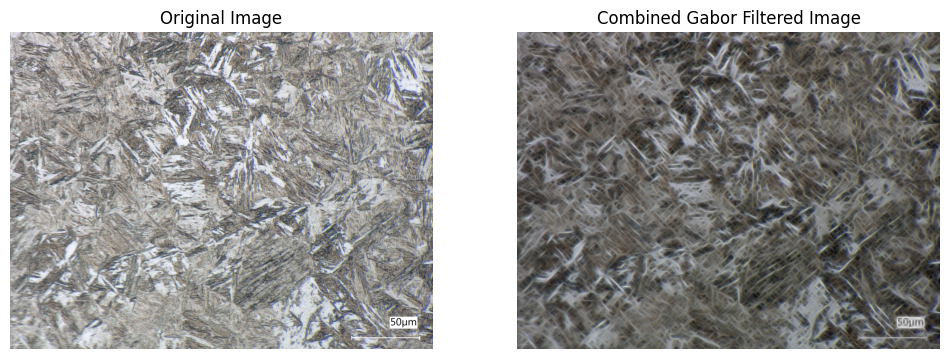

In [8]:
# ===== 2. Define Gabor filter parameters =====
ksize = 31          # size of the filter (odd number)
sigma = 4.0         # Gaussian envelope
gamma = 0.5         # aspect ratio
psi = 0             # phase offset

# Multiple orientations and wavelengths
thetas = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # 0°, 45°, 90°, 135°
lambdas = [5, 10, 15]                      # wavelengths

# ===== 3. Apply multiple Gabor filters =====
filtered_images = []

for theta in thetas:
    for lam in lambdas:
        kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lam, gamma, psi, ktype=cv2.CV_32F)
        filtered = cv2.filter2D(img, cv2.CV_32F, kernel)
        filtered_images.append(filtered)

# Optional: combine filtered images by taking the maximum response
combined = np.maximum.reduce(filtered_images)

# Normalize for display
combined_norm = cv2.normalize(combined, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# ===== 4. Display results =====
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Combined Gabor Filtered Image")
plt.imshow(combined_norm, cmap='gray')
plt.axis('off')

plt.show()

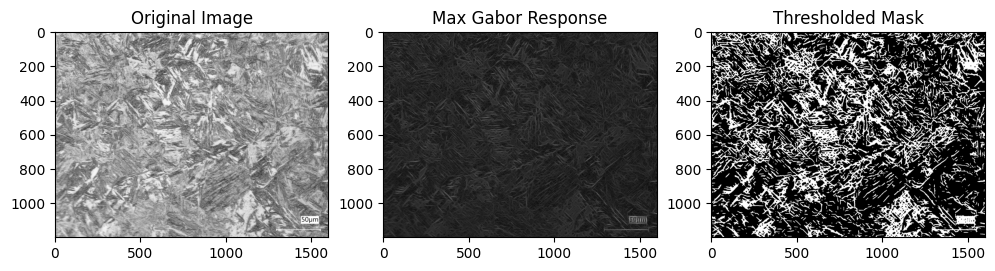

In [24]:
import cv2
import numpy as np
from skimage.filters import threshold_otsu
import matplotlib.pyplot as plt

# Load grayscale image
img = image.copy()

# Parameters for Gabor filter
ksize = 31          # size of filter kernel
sigma = 4.0         # Gaussian sigma
theta_list = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # orientations
lambd = 10.0        # wavelength
gamma = 0.5         # spatial aspect ratio
psi = 0             # phase offset

# Compute maximum Gabor response
gabor_max = np.zeros_like(img, dtype=np.float32)
for theta in theta_list:
    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
    filtered = cv2.filter2D(img.astype(np.float32), cv2.CV_32F, kernel)
    gabor_max = np.maximum(gabor_max, filtered)

# Normalize to 0-255
gabor_norm = cv2.normalize(gabor_max, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Threshold the texture map
thresh_val = threshold_otsu(gabor_norm)
mask = (gabor_norm > thresh_val).astype(np.uint8) * 255

# Optional: clean mask with morphology
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_CLOSE, kernel)

# Display
plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
plt.title("Original Image")
plt.imshow(img, cmap='gray')
plt.subplot(1,3,2)
plt.title("Max Gabor Response")
plt.imshow(gabor_norm, cmap='gray')
plt.subplot(1,3,3)
plt.title("Thresholded Mask")
plt.imshow(mask_clean, cmap='gray')
plt.show()


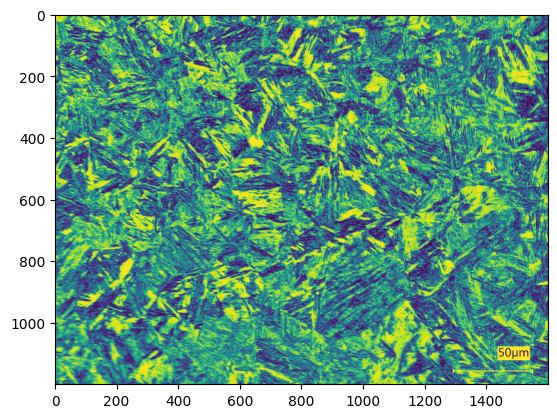

In [25]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img_enh = clahe.apply(img)
plt.imshow(img_enh)

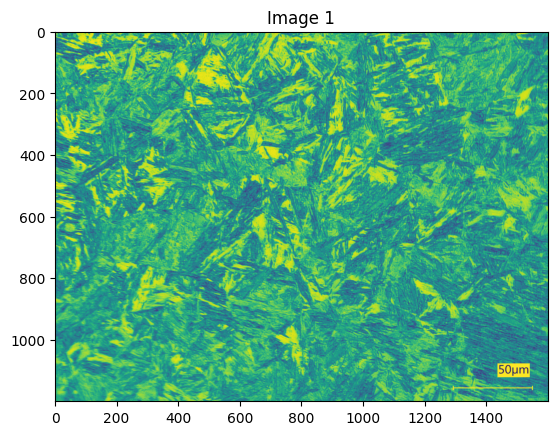

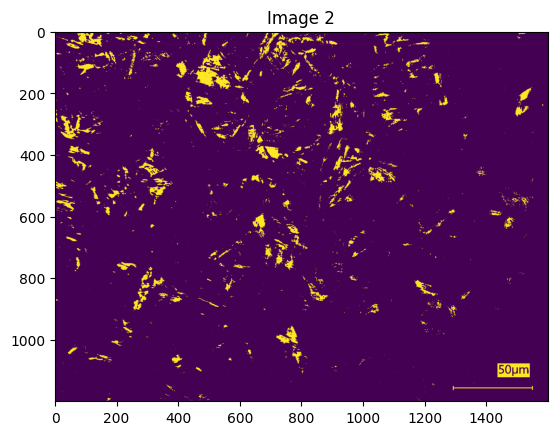

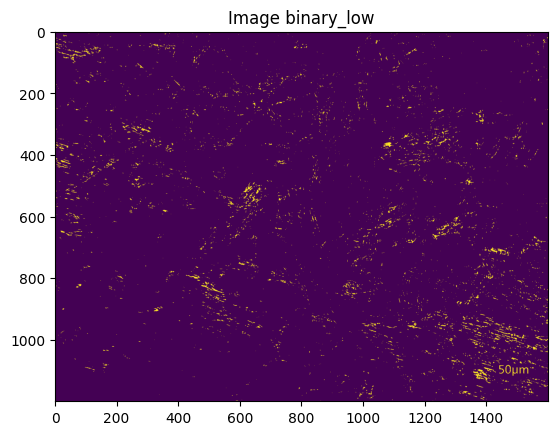

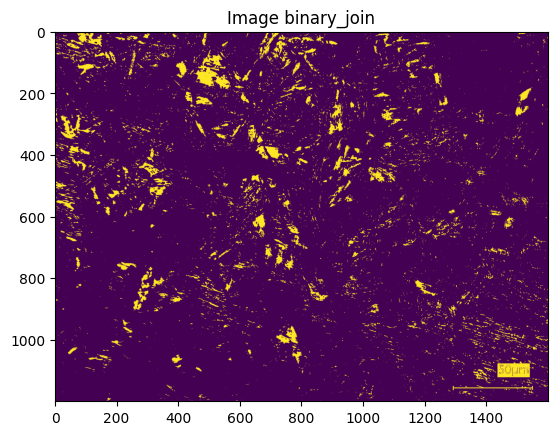

In [26]:
import numpy as np


dir = 'data_labeling\\src\\raw_images'
segment_files = glob.glob(os.path.join(dir, '*.tif'))
img = io.imread(segment_files[0])

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# img = histograms["bainite"]["img"][0]

threshold = 225
binary = np.where(gray > threshold, 255, 0).astype(np.uint8)
threshold_low = 80
binary_low = np.where(gray < threshold_low, 255, 0).astype(np.uint8)

plt.figure()
plt.imshow(gray)
plt.title("Image 1")

plt.figure()
plt.imshow(binary)
plt.title("Image 2")

plt.figure()
plt.imshow(binary_low)
plt.title("Image binary_low")


plt.figure()
plt.imshow(cv2.bitwise_or(binary_low, binary))
plt.title("Image binary_join")

plt.show()


In [21]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.filters import threshold_otsu

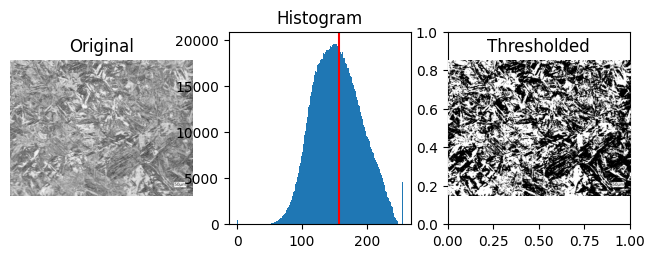

In [22]:
image = gray.copy()
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = plt.subplots(ncols=3, figsize=(8, 2.5))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.show()

In [ ]:
mask = cv2.adaptiveThreshold(
    image,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    51,  # block size (adjust for needle size)
    -5   # C value (tune for your contrast)
)

In [27]:
imgA_bin = (binary > 0).astype(np.uint8)

In [28]:
img = imgA_bin.copy()
for _ in range(1):
    img = cellular_automata(img)
    
img_vis = img * 255
plt.imshow(img_vis)

NameError: name 'cellular_automata' is not defined

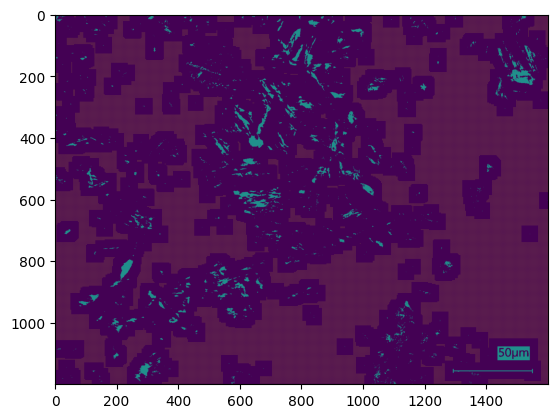

In [186]:
img = imgA_bin.copy()

import numpy as np

def sliding_window_mark(binary_array, window_size=53, stride=3):
    """
    Parameters
    ----------
    binary_array : np.ndarray
        2D numpy array containing 0s and 1s
    window_size : int
        Odd-sized sliding window (e.g. 3, 5, 7)

    Returns
    -------
    np.ndarray
        Array where center pixels are set to 2 if their window contains no 1s
    """
    assert window_size % 2 == 1, "window_size must be odd"

    h, w = binary_array.shape
    h_list = range(0,h, stride)
    w_list = range(0,w, stride)
    pad = window_size // 2

    # Pad array so sliding window works at borders
    padded = np.pad(binary_array, pad, mode='constant', constant_values=0)

    # Copy output
    output = binary_array.copy()

    for i in h_list:
        for j in w_list:
            window = padded[i:i + window_size, j:j + window_size]

            # If no 1 in the window, mark center pixel as 2
            if not np.any(window == 1):
                output[i, j] = 2

    return output


img = imgA_bin.copy()
img = sliding_window_mark(img)
plt.imshow(img)

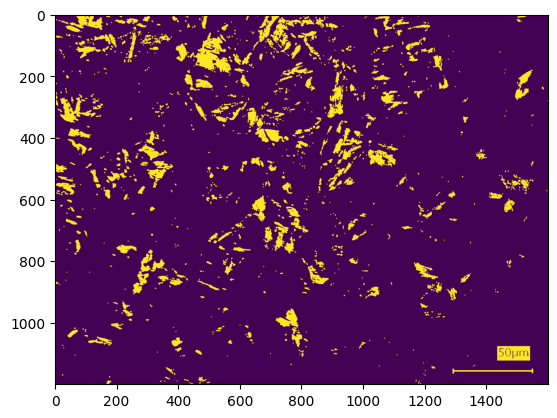

In [29]:
import numpy as np
from scipy.signal import convolve2d

def cellular_automata_grow_1_2(imgA):
    kernel = np.ones((3, 3), dtype=int)
    kernel[1, 1] = 0  # exclude center pixel

    # Count neighbors of label 1 and 2
    count_1 = convolve2d((imgA == 1).astype(int), kernel, mode='same', boundary='fill')
    count_2 = convolve2d((imgA == 2).astype(int), kernel, mode='same', boundary='fill')

    imgB = imgA.copy()

    empty = imgA == 0

    # Grow where only one label dominates
    imgB[empty & (count_1 > count_2) & (count_1 > 0)] = 1
    imgB[empty & (count_2 > count_1) & (count_2 > 0)] = 2

    # Handle ties randomly
    tie = empty & (count_1 == count_2) & (count_1 > 0)
    imgB[tie] = np.random.choice([1, 2], size=tie.sum())

    return imgB

def run_automata(img, steps=1):
    for _ in range(steps):
        img = cellular_automata_grow_1_2(img)
    return img

plt.imshow(run_automata(img))

In [30]:
import numpy as np
from sklearn.cluster import DBSCAN
import cv2

img = imgA_bin.copy()

ys, xs = np.where(img == 1)
points = np.column_stack((xs, ys))
eps = 0.02 * max(img.shape)  # % of image size

# Run DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=280)
labels = dbscan.fit_predict(points)

# Create label image
cluster_img = np.full(img.shape, -1, dtype=np.int32)
for (x, y), label in zip(points, labels):
    cluster_img[y, x] = label

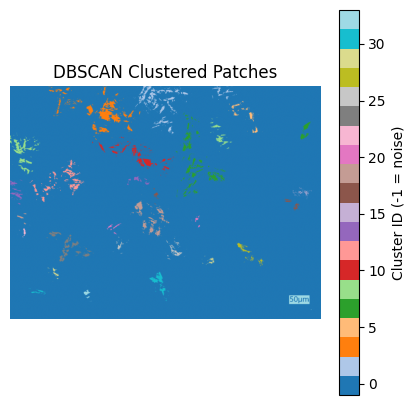

In [31]:
plt.figure(figsize=(5, 5))
plt.imshow(cluster_img, cmap="tab20")
plt.colorbar(label="Cluster ID (-1 = noise)")
plt.title("DBSCAN Clustered Patches")
plt.axis("off")
plt.show()

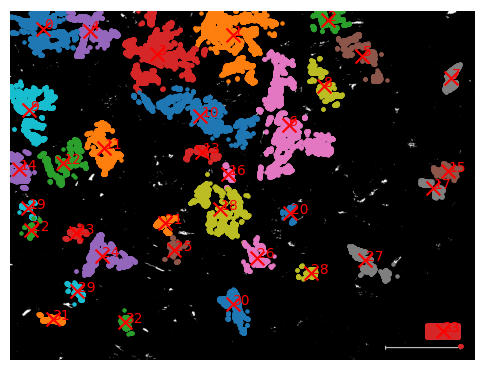

In [32]:
import numpy as np

centers = {}

for label in np.unique(labels):
    if label < 0:
        continue  # skip noise

    cluster_points = points[labels == label]
    center = cluster_points.mean(axis=0)  # (x, y)
    centers[label] = center
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.imshow(img, cmap="gray")
plt.axis("off")

# plot cluster points
for label in np.unique(labels):
    if label < 0:
        continue
    pts = points[labels == label]
    plt.scatter(pts[:, 0], pts[:, 1], s=5, label=f"C{label}")

# plot centers
for label, (cx, cy) in centers.items():
    plt.scatter(cx, cy, c="red", s=100, marker="x")
    plt.text(cx + 2, cy + 2, str(label), color="red")

# plt.legend(markerscale=3, fontsize=8)
plt.show()


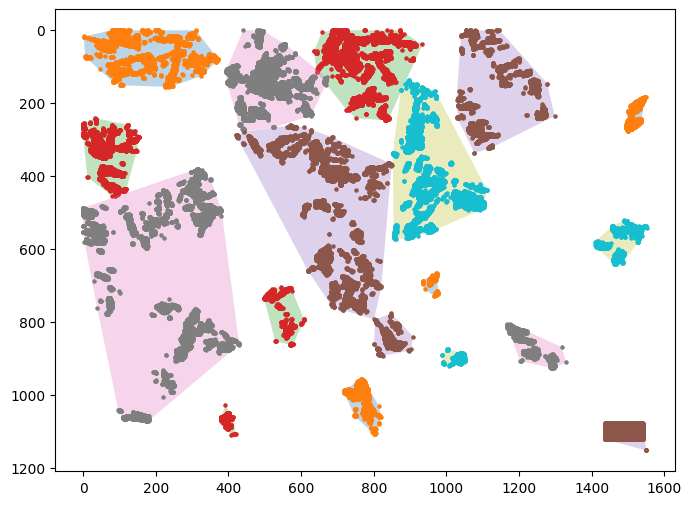

In [33]:
import numpy as np
from scipy.spatial import ConvexHull, distance_matrix
import networkx as nx
import matplotlib.pyplot as plt

# Assume points is Nx2 array, labels is cluster labels array

unique_labels = np.unique(labels[labels >= 0])
centers = {label: points[labels == label].mean(axis=0) for label in unique_labels}

# 1. Compute convex hulls for each cluster
hulls = {}
for label in unique_labels:
    pts = points[labels == label]
    if len(pts) >= 3:
        hulls[label] = ConvexHull(pts)
    else:
        hulls[label] = None  # too few points for hull

# 2. Build distance matrix between cluster centers
center_points = np.array([centers[label] for label in unique_labels])
dist_mat = distance_matrix(center_points, center_points)

# 3. Build graph where edges connect clusters closer than threshold
threshold = 180  # adjust based on scale
G = nx.Graph()
for i, label_i in enumerate(unique_labels):
    G.add_node(label_i)
    for j, label_j in enumerate(unique_labels):
        if i >= j:
            continue
        if dist_mat[i, j] < threshold:
            G.add_edge(label_i, label_j)

# 4. Find connected components
merged_clusters = list(nx.connected_components(G))

# 5. For each merged cluster, get all points and compute merged boundary
plt.figure(figsize=(8,6))
for comp in merged_clusters:
    merged_pts = np.vstack([points[labels == label] for label in comp])
    if len(merged_pts) >= 3:
        merged_hull = ConvexHull(merged_pts)
        plt.fill(merged_pts[merged_hull.vertices, 0],
                 merged_pts[merged_hull.vertices, 1],
                 alpha=0.3)
    plt.scatter(merged_pts[:, 0], merged_pts[:, 1], s=5)

plt.gca().invert_yaxis()
plt.show()

In [34]:
import cv2

for label, pts in regions.items():
    pts = np.array(pts, dtype=np.int32)
    hull = cv2.convexHull(pts)

    mask = np.zeros(img.shape, dtype=np.uint8)
    cv2.fillConvexPoly(mask, hull, 1)

    cluster_img[mask == 1] = label

plt.imshow(cluster_img)

NameError: name 'regions' is not defined

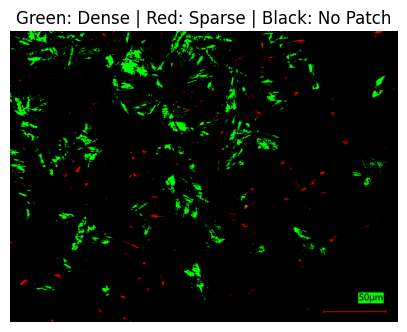

In [36]:
vis = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)

# Dense clusters
vis[cluster_img >= 0] = [0, 255, 0]      # green

# Sparse (noise) patches
vis[(cluster_img == -1) & (img == 1)] = [255, 0, 0]  # red

plt.figure(figsize=(5, 5))
plt.imshow(vis)
plt.title("Green: Dense | Red: Sparse | Black: No Patch")
plt.axis("off")
plt.show()


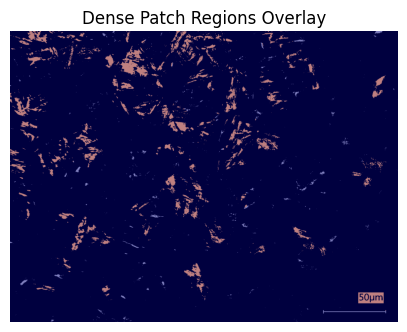

In [37]:
plt.figure(figsize=(5, 5))
plt.imshow(img, cmap="gray")
plt.imshow(cluster_img >= 0, cmap="jet", alpha=0.5)
plt.title("Dense Patch Regions Overlay")
plt.axis("off")
plt.show()


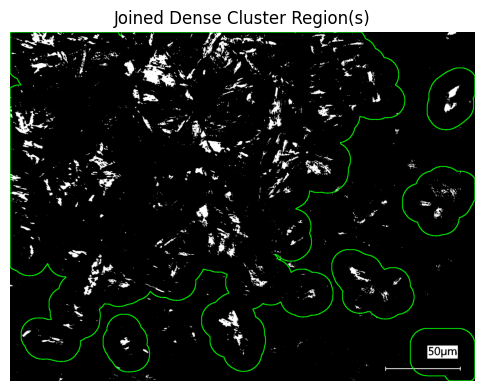

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Dense cluster mask
dense_mask = (cluster_img >= 0).astype(np.uint8) * 255
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (120, 120))
dense_mask_connected = cv2.dilate(dense_mask, kernel)
contours, _ = cv2.findContours(
    dense_mask_connected,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)
overlay = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
cv2.drawContours(overlay, contours, -1, (0, 255, 0), 2)

plt.figure(figsize=(6, 6))
plt.imshow(overlay)
plt.title("Joined Dense Cluster Region(s)")
plt.axis("off")
plt.show()


In [35]:
kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (120, 120)   # <-- controls merging distance
)

merged_mask = cv2.dilate(dense_mask, kernel)
num_regions, region_labels = cv2.connectedComponents(merged_mask)
overlay = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

for region_id in range(1, num_regions):
    region_mask = (region_labels == region_id).astype(np.uint8) * 255

    contours, _ = cv2.findContours(
        region_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(overlay, contours, -1, (0, 255, 0), 2)
plt.figure(figsize=(6, 6))
plt.imshow(overlay)
plt.title("Grouped Dense Regions (Multiple)")
plt.axis("off")
plt.show()


NameError: name 'dense_mask' is not defined

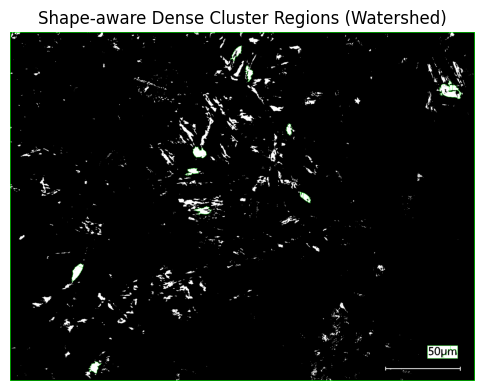

In [ ]:
# Step 1: Create binary mask for dense clusters
dense_mask = (cluster_img >= 0).astype(np.uint8) * 255

# Step 2: Noise removal / small hole closing (optional)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
dense_mask_clean = cv2.morphologyEx(dense_mask, cv2.MORPH_CLOSE, kernel)

# Step 3: Distance transform
dist = cv2.distanceTransform(dense_mask_clean, cv2.DIST_L2, 5)

# Step 4: Threshold distance to get sure foreground
ret, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, 0)
sure_fg = np.uint8(sure_fg)

# Step 5: Sure background
sure_bg = cv2.dilate(dense_mask_clean, np.ones((15, 15), np.uint8), iterations=1)

# Step 6: Unknown region
unknown = cv2.subtract(sure_bg, sure_fg)

# Step 7: Marker labeling for watershed
ret, markers = cv2.connectedComponents(sure_fg)

# Step 8: Prepare markers
markers = markers + 1            # Background is 1 instead of 0
markers[unknown == 255] = 0      # Unknown regions set to 0

# Step 9: Apply watershed
img_color = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
markers = cv2.watershed(img_color, markers)

# Step 10: Overlay contours where watershed found boundaries (-1)
overlay = img_color.copy()
overlay[markers == -1] = [0, 255, 0]  # Green boundaries

# Optional: Extract watershed boundaries as contours for drawing lines
contours, _ = cv2.findContours((markers == -1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(overlay, contours, -1, (0, 255, 0), 2)

# Step 11: Show result
plt.figure(figsize=(6, 6))
plt.imshow(overlay)
plt.title("Shape-aware Dense Cluster Regions (Watershed)")
plt.axis("off")
plt.show()

In [ ]:
# Step 1: Dilate patches
kernel_size = 10  # increase to merge more
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
dense_mask_dilated = cv2.dilate(dense_mask, kernel)

alpha = 0.1  # increase from 0.03 to merge more
concave_hull = alphashape(points, alpha)

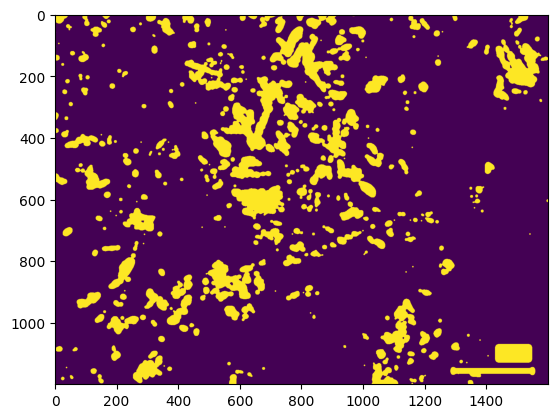

In [164]:
img = imgA_bin.copy()
blurred = cv2.GaussianBlur(img.astype(np.float32), (21,21), 0)
merged_mask = (blurred > 0.01).astype(np.uint8) * 255
plt.imshow(merged_mask)

In [ ]:
import numpy as np
from scipy.ndimage import binary_dilation

def place_sparse_points(array, num_points=5):
    """
    Place sparse points (value 2) in a binary 2D array where:
    - The cell is currently 0
    - No 1 exists in the 8-neighborhood
    
    Parameters:
    - array: 2D numpy array with 0s and 1s
    - num_points: maximum number of points to place
    
    Returns:
    - Modified array with some 0s changed to 2s
    """
    # Create a copy to avoid modifying the original
    result = array.copy()
    
    # Find all cells with 1s and dilate to get their neighborhoods
    ones_mask = (array == 1)
    neighborhood = binary_dilation(ones_mask, structure=np.ones((3, 3)))
    
    # Find valid positions: cells that are 0 and not in neighborhood of any 1
    valid_positions = (array == 0) & (~neighborhood)
    
    # Get coordinates of valid positions
    valid_coords = np.argwhere(valid_positions)
    
    if len(valid_coords) == 0:
        print("No valid positions found")
        return result
    
    # Randomly select a few points (not too many)
    num_to_place = min(num_points, len(valid_coords))
    selected_indices = np.random.choice(len(valid_coords), num_to_place, replace=False)
    selected_coords = valid_coords[selected_indices]
    
    # Place 2s at selected positions
    for coord in selected_coords:
        result[coord[0], coord[1]] = 2
    
    return result

In [289]:
def place_random_points(array, num_points=5):
    """
    Place random points (value 2) in a 2D array where cells are currently 0.
    
    Parameters:
    - array: 2D numpy array
    - num_points: number of points to place
    
    Returns:
    - Modified array with some 0s changed to 2s
    """
    # Create a copy to avoid modifying the original
    result = array.copy()
    
    # Find all cells that are 0
    zero_positions = (array == 0)
    
    # Get coordinates of zero positions
    zero_coords = np.argwhere(zero_positions)
    
    if len(zero_coords) == 0:
        print("No zero positions found")
        return result
    
    # Randomly select points
    num_to_place = min(num_points, len(zero_coords))
    selected_indices = np.random.choice(len(zero_coords), num_to_place, replace=False)
    selected_coords = zero_coords[selected_indices]
    
    # Place 2s at selected positions
    for coord in selected_coords:
        result[coord[0], coord[1]] = 2
    
    return result

In [300]:
def place_random_points_with_spacing(array, num_points=5, min_distance=3):
    """
    Place random points (value 2) in a 2D array where cells are currently 0,
    ensuring minimum distance between placed points.
    
    Parameters:
    - array: 2D numpy array
    - num_points: number of points to place
    - min_distance: minimum distance between placed points (in cells)
    
    Returns:
    - Modified array with some 0s changed to 2s
    """
    from scipy.ndimage import binary_dilation
    
    # Create a copy to avoid modifying the original
    result = array.copy()
    
    # Find all cells that are 0
    zero_positions = (array == 0)
    zero_coords = np.argwhere(zero_positions)
    
    if len(zero_coords) == 0:
        print("No zero positions found")
        return result
    
    # Create structure for neighborhood checking based on min_distance
    structure_size = 2 * min_distance + 1
    structure = np.ones((structure_size, structure_size), dtype=bool)
    
    placed_count = 0
    attempts = 0
    max_attempts = len(zero_coords) * 2  # Prevent infinite loop
    
    # Shuffle coordinates for random selection
    np.random.shuffle(zero_coords)
    
    for coord in zero_coords:
        if placed_count >= num_points:
            break
            
        attempts += 1
        if attempts > max_attempts:
            print(f"Could only place {placed_count} points with min_distance={min_distance}")
            break
        
        y, x = coord
        
        # Check if this position is still valid (is 0)
        if result[y, x] != 0:
            continue
        
        # Check if there's already a 2 in the neighborhood
        placed_twos = (result == 2)
        neighborhood = binary_dilation(placed_twos, structure=structure)
        
        if not neighborhood[y, x]:
            # Position is valid, place a 2
            result[y, x] = 2
            placed_count += 1
    
    return result

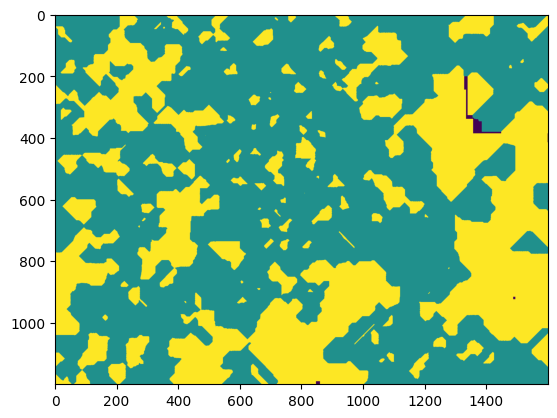

In [313]:
img = imgA_bin.copy()
result = place_random_points_with_spacing(img, num_points=300, min_distance=3)
r= run_automata(result, steps = 75)
plt.imshow(r)

In [271]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import MultiPoint
from shapely.ops import unary_union
from alphashape import alphashape  # pip install alphashape

# ------------------------------
# Inputs
# img         : grayscale image, values [0,1]
# cluster_img : >=0 indicates dense patch
# ------------------------------

img = imgA_bin.copy()

# Step 1: Create binary mask
dense_mask = (cluster_img >= 0).astype(np.uint8)

# Step 2: Find coordinates of all dense pixels
ys, xs = np.where(dense_mask > 0)
points = np.column_stack((xs, ys))

# Step 3: Compute alpha shape (concave hull)
if len(points) > 3:
    alpha = 0.02  # smaller -> tighter around patches
    concave_hull = alphashape(points, alpha)
else:
    concave_hull = MultiPoint(points).convex_hull

# Step 4: Rasterize hull to mask
hull_mask = np.zeros_like(dense_mask, dtype=np.uint8)
if concave_hull.geom_type == 'Polygon':
    # Convert polygon to integer points for OpenCV
    coords = np.array(concave_hull.exterior.coords, dtype=np.int32)
    cv2.fillPoly(hull_mask, [coords], 255)
elif concave_hull.geom_type == 'MultiPolygon':
    for poly in concave_hull.geoms:
        coords = np.array(poly.exterior.coords, dtype=np.int32)
        cv2.fillPoly(hull_mask, [coords], 255)

# Step 5: Overlay on image
overlay = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
overlay[hull_mask > 0] = [0, 255, 0]  # green region

# Step 6: Show
plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.title("Merged Dense Cluster Region (Shape-aware)")
plt.axis("off")
plt.show()


KeyboardInterrupt: 

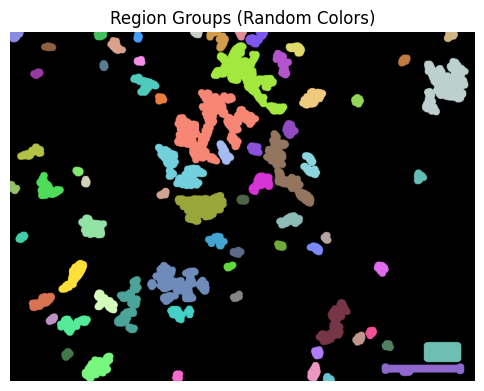

In [87]:
region_vis = np.zeros((*img.shape, 3), dtype=np.uint8)

rng = np.random.default_rng(42)
colors = rng.integers(50, 255, size=(num_regions, 3))

for r in range(1, num_regions):
    region_vis[region_labels == r] = colors[r]

plt.figure(figsize=(6, 6))
plt.imshow(region_vis)
plt.title("Region Groups (Random Colors)")
plt.axis("off")
plt.show()


In [ ]:
import numpy as np

cluster_ids = [cid for cid in np.unique(labels) if cid != -1]

clusters = {}
for cid in cluster_ids:
    pts = points[labels == cid]
    clusters[cid] = {
        "points": pts,
        "centroid": pts.mean(axis=0),
        "size": len(pts)
    }


In [ ]:
from scipy.spatial.distance import cdist

centroids = np.array([clusters[c]["centroid"] for c in cluster_ids])

D_merge = 100  # <-- aggressive merging distance (pixels)

dist_matrix = cdist(centroids, centroids)

neighbors = {
    cluster_ids[i]: [
        cluster_ids[j]
        for j in range(len(cluster_ids))
        if i != j and dist_matrix[i, j] < D_merge
    ]
    for i in range(len(cluster_ids))
}


In [106]:
valid_clusters = {
    cid for cid, nbrs in neighbors.items() if len(nbrs) > 0
}


In [107]:
visited = set()
regions = []

for cid in valid_clusters:
    if cid in visited:
        continue

    stack = [cid]
    region = set()

    while stack:
        c = stack.pop()
        if c in visited:
            continue

        visited.add(c)
        region.add(c)

        for n in neighbors[c]:
            if n in valid_clusters:
                stack.append(n)

    regions.append(region)


In [108]:
import cv2
import matplotlib.pyplot as plt

overlay = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

for region in regions:
    region_pts = np.vstack([clusters[c]["points"] for c in region])
    hull = cv2.convexHull(region_pts.astype(np.int32))
    cv2.polylines(overlay, [hull], True, (0, 255, 0), 2)


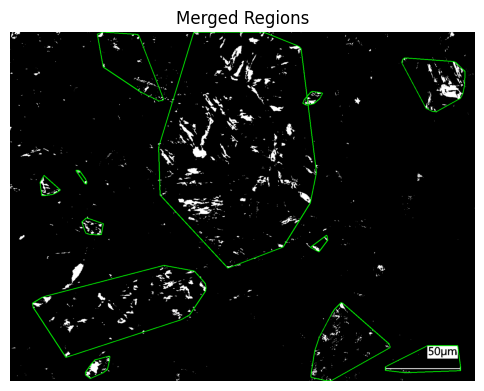

In [109]:
overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6, 6))
plt.imshow(overlay_rgb)
plt.title("Merged Regions")
plt.axis("off")
plt.show()


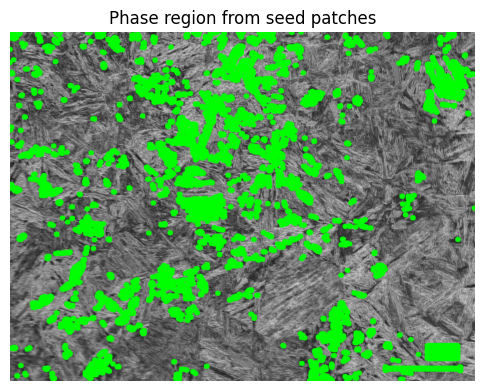

In [123]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import reconstruction

img = imgA_bin.copy()

# Ensure binary
seeds = (img > 0).astype(np.uint8)

# # Optional mask: slightly dilated version to allow seed growth
# kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
# mask = cv2.dilate(seeds, kernel)
# mask = (mask > 0).astype(np.uint8)

# # Convert to float for skimage
# seeds_f = seeds.astype(np.float32)
# mask_f = mask.astype(np.float32)

# # Dilation-based reconstruction
# grown = reconstruction(seeds_f, mask_f, method='dilation')
# grown = (grown > 0).astype(np.uint8)




# Aggressively dilate the mask to allow growth
kernel_size = 25  # bigger → more aggressive growth
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
mask = cv2.dilate(seeds, kernel)
mask = (mask > 0).astype(np.uint8)

# Morphological reconstruction
grown = reconstruction(seeds.astype(np.float32), mask.astype(np.float32), method='dilation')
grown = (grown > 0).astype(np.uint8)



# kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
# grown_merged = cv2.dilate(grown, kernel)

# overlay = cv2.cvtColor((gray * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
# overlay[grown_merged > 0] = [0, 255, 0]  # green = phase region

plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.title("Phase region from seed patches")
plt.axis('off')
plt.show()



In [ ]:
overlay = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
overlay[grown_merged > 0] = [0, 255, 0]  # green for phase

plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.title("Phase Region from Patches")
plt.axis('off')
plt.show()


In [93]:
isolated = set(cluster_ids) - valid_clusters

for cid in isolated:
    pts = clusters[cid]["points"]
    hull = cv2.convexHull(pts.astype(np.int32))
    cv2.polylines(overlay, [hull], True, (255, 0, 0), 1)


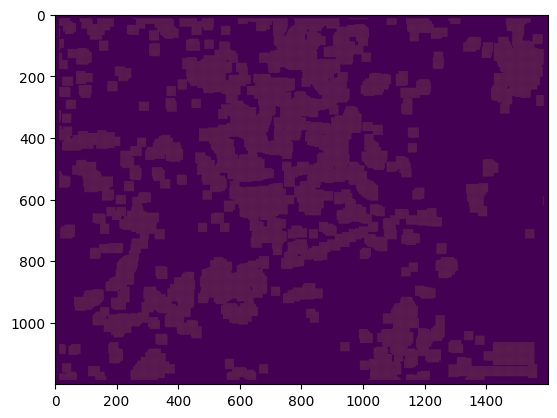

In [79]:
def sliding_window_max_strided_same(imgA, window_size, stride):
    h, w = imgA.shape
    wh, ww = window_size
    sh, sw = stride

    imgB = np.zeros_like(imgA)

    for i in range(0, h - wh + 1, sh):
        for j in range(0, w - ww + 1, sw):
            max_val = imgA[i:i+wh, j:j+ww].max()
            imgB[i + wh//2, j + ww//2] = max_val

    return imgB

imgB = sliding_window_max_strided_same(
    binary,
    window_size=(30, 30),
    stride=(3, 3)
)
plt.imshow(imgB)

In [40]:
import cv2
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

segment_dir = 'output_segments'

segment_files = glob.glob(os.path.join(segment_dir, '*.png'))
segment_files

['output_segments\\797-DQ-full_1000x-1_bainite_1.png',
 'output_segments\\797-DQ-full_1000x-1_bainite_2.png',
 'output_segments\\797-DQ-full_1000x-1_bainite_3.png',
 'output_segments\\797-DQ-full_1000x-1_bainite_4.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_1.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_2.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_3.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_4.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_5.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_6.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_7.png',
 'output_segments\\797-DQ-full_1000x-1_martensite_8.png',
 'output_segments\\797-DQ-full_1000x-2_bainite_1.png',
 'output_segments\\797-DQ-full_1000x-2_bainite_2.png',
 'output_segments\\797-DQ-full_1000x-2_bainite_3.png',
 'output_segments\\797-DQ-full_1000x-2_bainite_4.png',
 'output_segments\\797-DQ-full_1000x-2_bainite_5.png',
 'output_segments\\797-DQ-full_1000x-2_ma

In [104]:
len(segment_files)

23

In [41]:
from skimage.feature import graycomatrix, graycoprops
from skimage import io, color
from skimage.util import img_as_ubyte

def get_glcm(image):
    # Convert to grayscale if needed
    if image.ndim == 3:
        image = color.rgb2gray(image)

    # Convert to 8-bit unsigned integers (0–255)
    image = img_as_ubyte(image)

    # Compute GLCM
    glcm = graycomatrix(
        image,
        distances=[1],                  # pixel distance
        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
        levels=256,
        symmetric=True,
        normed=True
    )

    print("GLCM shape:", glcm.shape)
    features = {
    "contrast": graycoprops(glcm, "contrast"),
    "dissimilarity": graycoprops(glcm, "dissimilarity"),
    "homogeneity": graycoprops(glcm, "homogeneity"),
    "energy": graycoprops(glcm, "energy"),
    "correlation": graycoprops(glcm, "correlation"),
    "ASM": graycoprops(glcm, "ASM")
    }
    print(features)
    feature_vector = [np.mean(value) for value in features.values()]
    print("Feature vector:", feature_vector)
    return feature_vector, features

In [43]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
import matplotlib.pyplot as plt

import os
import glob
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt


lbp_scales = [
    (1, 8),   # fine texture
    (2, 16),  # medium texture
    (3, 24)   # coarse texture
]

lbp_scales = [
    (1, 8),     # lath edges
    (2, 16),    # sub-lath texture
    (3, 24),    # lath bundles
    (4, 32),    # packet/block structure
    (5, 40)     # coarse bainitic regions (optional)
]

def multiscale_lbp(gray, lbp_scales):
    multi_lbp_hist = []

    for radius, n_points in lbp_scales:
        lbp = local_binary_pattern(
            gray,
            n_points,
            radius,
            method='uniform'
        )

        n_bins = n_points + 2  # uniform LBP

        lbp_hist, _ = np.histogram(
            lbp.ravel(),
            bins=n_bins,
            range=(0, n_bins),
            density=True
        )

        lbp_hist = lbp_hist.astype("float")
        lbp_hist /= (lbp_hist.sum() + 1e-6)

        multi_lbp_hist.append(lbp_hist)

    # 🔑 concatenate all scales into ONE vector
    return np.hstack(multi_lbp_hist)

def lbp_function(segment_dir = 'output_segments'):
    # Step 1: Load images and labels, compute grayscale histograms

    # segment_dir = 'slic_out'
    # Initialize dictionaries to hold histograms per category
    histograms = {
        'martensite': 
            {"lbp" : [],
            "img_hist" : [],
            "img" : [],
            "multiscale_lbp" : [],
            "glcm_features" : [],
            "glcm_full" : []
            },
        'bainite':
            {"lbp" : [],
            "img_hist" : [],
            "img" : [],
            "multiscale_lbp" : [],
            "glcm_features" : [],
            "glcm_full" : []
            },
    }
    labels = []
    # imgs = []
    segment_files = glob.glob(os.path.join(segment_dir, '*.png'))

    for filename in segment_files:
        # --- Parameters for LBP ---
        radius = 1          # Radius of the circle
        n_points = 4 * radius  # Number of points to sample
        
        parts = filename.split("_")
        label = parts[-2].lower()  # second last part is label
        print(label)

        if label not in histograms:
            print(f"Skipping unknown label '{label}' in file {filename}")
            continue

        # --- Load image ---
        image = cv2.imread(filename)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # --- Compute LBP ---
        # lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
        
        img_hist, _ = np.histogram(
            gray.ravel(),
            bins=256,
            range=(1, 256),
            density=True
        )
        
        # imgs.append(gray)

        # # Compute normalized histogram
        # lbp_hist, _ = np.histogram(
        #     lbp.ravel(),
        #     bins=256,
        #     range=(1, 256),
        #     density=True
        # )

        # Store histogram
        if label in histograms:
            # histograms[label]["lbp"].append(lbp_hist)
            histograms[label]["img_hist"].append(img_hist)
        else:
            print(f"Unknown label: {label}")

        multiscale_lbp_hist = multiscale_lbp(gray, lbp_scales)
        # multiscale_lbp_hist = prepare_lbp_parallel(gray)
        histograms[label]["multiscale_lbp"].append(multiscale_lbp_hist)
        glcm_avg_feats, feats = get_glcm(gray)
        histograms[label]["glcm_features"].append(glcm_avg_feats)
        histograms[label]["glcm_full"].append(feats)
        histograms[label]["img"].append(gray)

    
        # # Normalize histogram
        # hist = cv2.normalize(hist, hist).flatten()
        
        # hist, _ = np.histogram(lbp.ravel(),
        #                    bins=np.arange(0, n_points + 3),
        #                    range=(0, n_points + 2))

        # # Normalize the histogram
        # hist = hist.astype("float")
        # hist /= hist.sum()

        # histograms[label].append(hist)
        

        # # --- Optional: visualize ---
        # plt.figure(figsize=(10,4))
        # plt.subplot(1,2,1)
        # plt.title('Original (gray)')
        # plt.imshow(gray, cmap='gray')
        # plt.axis('off')

        # plt.subplot(1,2,2)
        # plt.title('LBP')
        # plt.imshow(lbp, cmap='gray')
        # plt.axis('off')

        # plt.tight_layout()
        # plt.show()
    return histograms

In [44]:
histograms = lbp_function()

bainite
GLCM shape: (256, 256, 1, 4)
{'contrast': array([[277.41100677, 386.62986097, 259.72213268, 503.7694562 ]]), 'dissimilarity': array([[ 6.70213206,  9.0914814 ,  7.32738084, 10.74371195]]), 'homogeneity': array([[0.44930568, 0.42192076, 0.44155552, 0.41508959]]), 'energy': array([[0.36862634, 0.36630645, 0.370673  , 0.36524129]]), 'correlation': array([[0.97843666, 0.96991558, 0.97982396, 0.96080072]]), 'ASM': array([[0.13588538, 0.13418041, 0.13739847, 0.1334012 ]])}
Feature vector: [np.float64(356.8831141551805), np.float64(8.466176561572237), np.float64(0.43196788472991), np.float64(0.3677117701549443), np.float64(0.972244227072556), np.float64(0.13521636679154556)]
bainite
GLCM shape: (256, 256, 1, 4)
{'contrast': array([[272.87626442, 441.44071349, 289.71930292, 429.00945373]]), 'dissimilarity': array([[6.17169476, 8.7386845 , 6.62959263, 9.13752508]]), 'homogeneity': array([[0.51609551, 0.48907635, 0.5133717 , 0.48634864]]), 'energy': array([[0.44328642, 0.43749391, 0.4424

In [ ]:
import cv2
import numpy as np
from skimage import measure, morphology
from matplotlib import pyplot as plt

# --- Step 1: Read image ---
img = cv2.imread('lom_image.png', cv2.IMREAD_GRAYSCALE)

# --- Step 2: Denoise / smooth ---
blur = cv2.GaussianBlur(img, (5,5))


C:\Users\hallo\AppData\Local\Temp\ipykernel_21688\3351436044.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(
C:\Users\hallo\AppData\Local\Temp\ipykernel_21688\3351436044.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(
C:\Users\hallo\AppData\Local\Temp\ipykernel_21688\3351436044.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(
C:\Users\hallo\AppData\Local\Temp\ipykernel_21688\3351436044.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.b

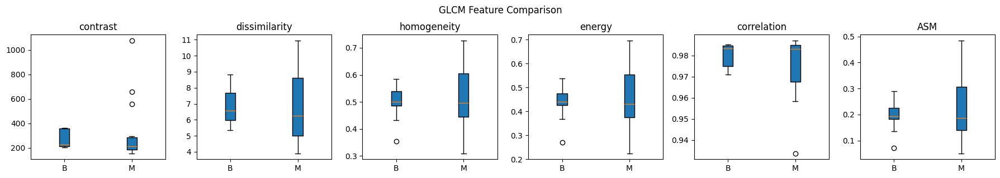

In [45]:
import numpy as np
import matplotlib.pyplot as plt

# Suppose these are your feature lists
# Each element is a feature vector of shape (6,)
bainite_features = histograms['bainite']['glcm_features']  # list of arrays
martensite_features = histograms['martensite']['glcm_features']

# Stack them into 2D arrays: shape = (num_samples, num_features)
bainite = np.stack(bainite_features)
martensite = np.stack(martensite_features)

# Feature names (if 6 features)
features = ["contrast", "dissimilarity", "homogeneity", "energy", "correlation", "ASM"]

plt.figure(figsize=(18, 3))

for i, f in enumerate(features):
    plt.subplot(1, 6, i + 1)  # subplot returns an axes, no unpacking needed
    plt.boxplot(
        [bainite[:, i], martensite[:, i]],
        labels=["B", "M"],
        patch_artist=True
    )
    plt.title(f)

plt.tight_layout()  # fixes spacing between subplots
plt.suptitle("GLCM Feature Comparison", y=1.05)  # move title slightly above
plt.show()

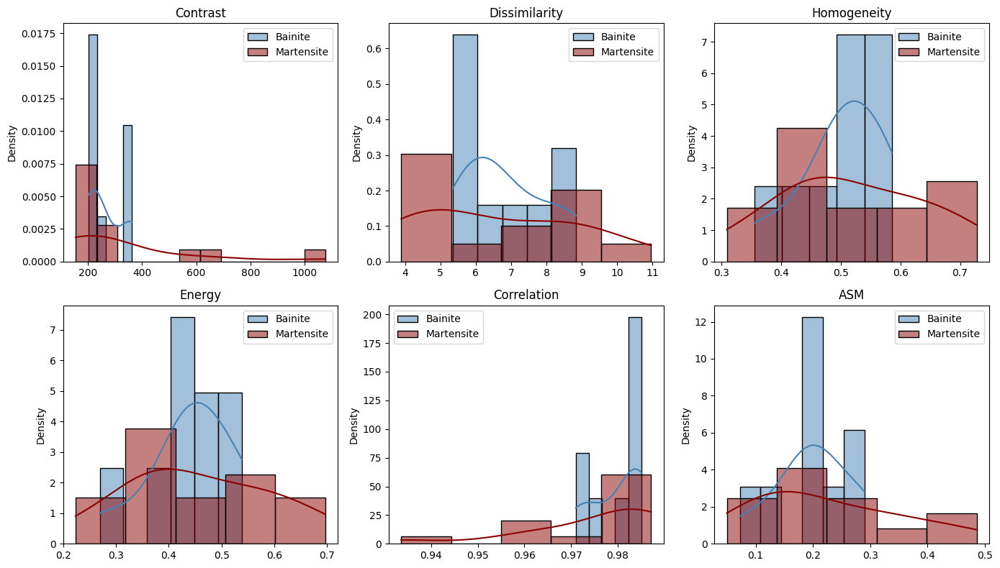

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

features = [
    "Contrast",
    "Dissimilarity",
    "Homogeneity",
    "Energy",
    "Correlation",
    "ASM"
]

plt.figure(figsize=(14, 8))

for i, f in enumerate(features):
    plt.subplot(2, 3, i + 1)
    sns.histplot(bainite[:, i], kde=True, stat="density",
                 color="steelblue", alpha=0.5, label="Bainite")
    sns.histplot(martensite[:, i], kde=True, stat="density",
                 color="darkred", alpha=0.5, label="Martensite")
    plt.title(f)
    plt.legend()

plt.tight_layout()
plt.show()


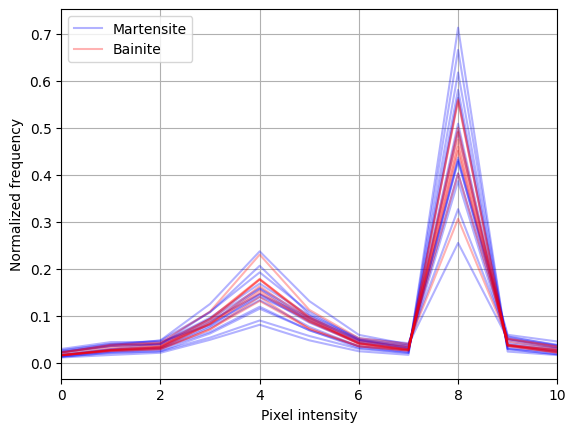

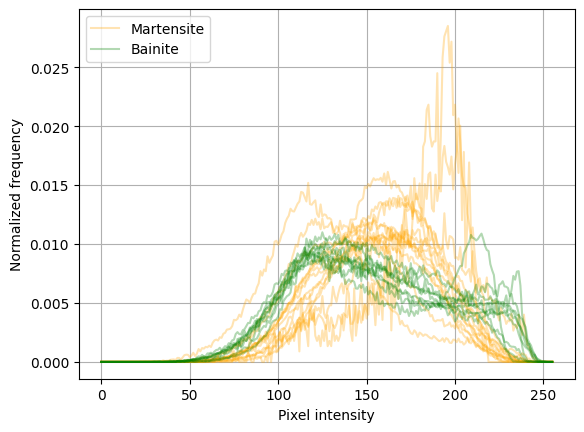

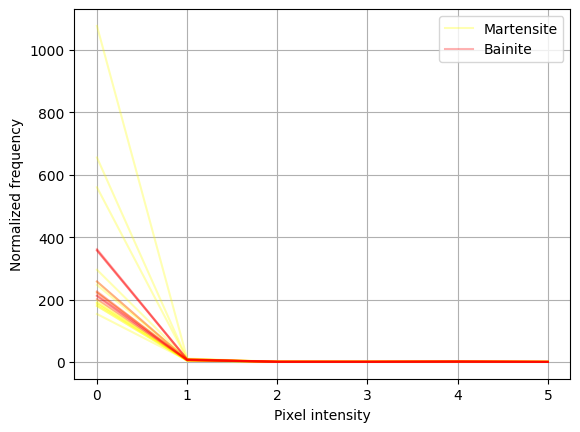

In [53]:
xmax=[0,10]
# Plot all martensite histograms in blue with some transparency
for hist in histograms['martensite']["multiscale_lbp"]:
    plt.plot(hist, color='blue', alpha=0.3, label='Martensite' if 'Martensite' not in plt.gca().get_legend_handles_labels()[1] else "")
    plt.xlim(xmax)

# Plot all bainite histograms in red with some transparency
for hist in histograms['bainite']["multiscale_lbp"]:
    plt.plot(hist, color='red', alpha=0.3, label='Bainite' if 'Bainite' not in plt.gca().get_legend_handles_labels()[1] else "")
    plt.xlim(xmax)

# plt.title('Grayscale Histograms of Martensite and Bainite Segments')
plt.xlabel('Pixel intensity')
plt.ylabel('Normalized frequency')
plt.legend()
plt.grid(True)
plt.show()

# Plot all martensite histograms in blue with some transparency
for hist in histograms['martensite']["img_hist"]:
    plt.plot(hist, color='orange', alpha=0.3, label='Martensite' if 'Martensite' not in plt.gca().get_legend_handles_labels()[1] else "")
    # plt.xlim(xmax)

# Plot all bainite histograms in red with some transparency
for hist in histograms['bainite']["img_hist"]:
    plt.plot(hist, color='green', alpha=0.3, label='Bainite' if 'Bainite' not in plt.gca().get_legend_handles_labels()[1] else "")
    # plt.xlim(xmax)

# plt.title('Grayscale Histograms of Martensite and Bainite Segments')
plt.xlabel('Pixel intensity')
plt.ylabel('Normalized frequency')
plt.legend()
plt.grid(True)
plt.show()

# Plot all martensite histograms in blue with some transparency
for hist in histograms['martensite']["glcm_features"]:
    plt.plot(hist, color='yellow', alpha=0.3, label='Martensite' if 'Martensite' not in plt.gca().get_legend_handles_labels()[1] else "")
    # plt.xlim(xmax)

# Plot all bainite histograms in red with some transparency
for hist in histograms['bainite']["glcm_features"]:
    plt.plot(hist, color='red', alpha=0.3, label='Bainite' if 'Bainite' not in plt.gca().get_legend_handles_labels()[1] else "")
    # plt.xlim(xmax)

# plt.title('Grayscale Histograms of Martensite and Bainite Segments')
plt.xlabel('Pixel intensity')
plt.ylabel('Normalized frequency')
plt.legend()
plt.grid(True)
plt.show()

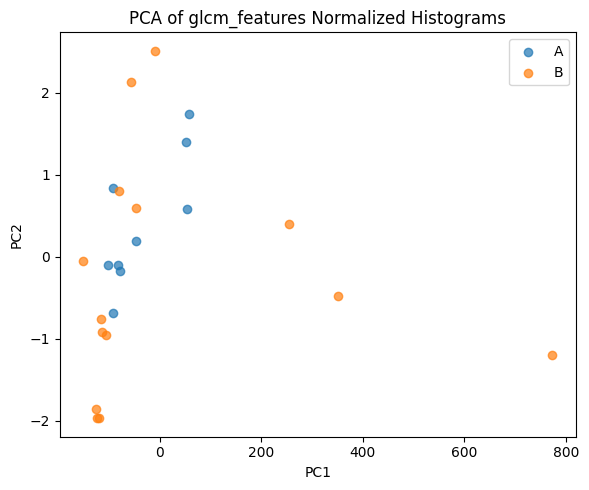

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

param_type = "glcm_features"

# Example: histograms_a and histograms_b are lists of 1D arrays
X = np.vstack([histograms['bainite'][param_type], histograms['martensite'][param_type]])

labels = np.array(
    [0] * len(histograms['bainite'][param_type]) + [1] * len(histograms['martensite'][param_type])
)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(6, 5))
plt.scatter(X_pca[labels == 0, 0], X_pca[labels == 0, 1],
            label="A", alpha=0.7)
plt.scatter(X_pca[labels == 1, 0], X_pca[labels == 1, 1],
            label="B", alpha=0.7)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"PCA of {param_type} Normalized Histograms")
plt.legend()
plt.tight_layout()
plt.show()


In [100]:
print(pca.explained_variance_ratio_)
print("Total:", pca.explained_variance_ratio_.sum())

[9.99964513e-01 3.53800445e-05]
Total: 0.9999998934526586


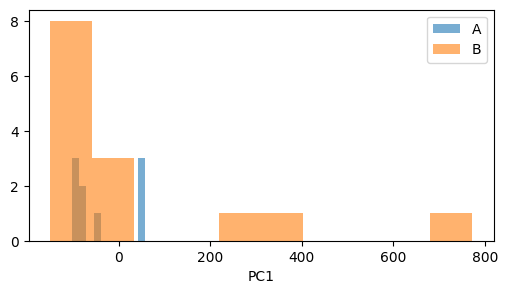

In [101]:
plt.figure(figsize=(6,3))
plt.hist(X_pca[labels==0, 0], bins=10, alpha=0.6, label='A')
plt.hist(X_pca[labels==1, 0], bins=10, alpha=0.6, label='B')
plt.xlabel("PC1")
plt.legend()
plt.show()


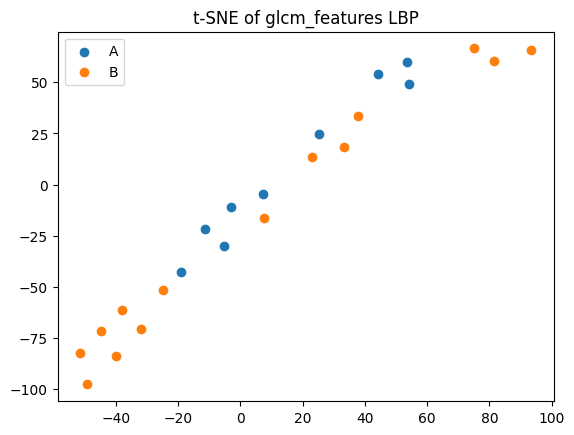

In [103]:
from sklearn.manifold import TSNE

X_tsne = TSNE(
    n_components=2,
    perplexity=5,   # small dataset → small perplexity
    random_state=42
).fit_transform(X)

plt.scatter(X_tsne[labels==0,0], X_tsne[labels==0,1], label='A')
plt.scatter(X_tsne[labels==1,0], X_tsne[labels==1,1], label='B')
plt.legend()
plt.title(f"t-SNE of {param_type} LBP")
plt.show()


In [107]:
from scipy.stats import entropy, skew

def hist_stats(hist):
    hist = hist / (hist.sum() + 1e-8)
    bins = np.arange(len(hist))

    mean = np.sum(bins * hist)
    var = np.sum((bins - mean) ** 2 * hist)
    std = np.sqrt(var)

    return [
        mean,
        std,
        entropy(hist),
        np.sum(hist ** 2),  # energy
        skew(hist)
    ]
lbp_bins_per_scale = [(n + 2) for _, n in lbp_scales]
def multiscale_lbp_stats_from_vector(lbp_vec, lbp_bins_per_scale):
    feats = []
    idx = 0

    for n_bins in lbp_bins_per_scale:
        scale_hist = lbp_vec[idx:idx + n_bins]
        feats.extend(hist_stats(scale_hist))
        idx += n_bins

    return feats

def glcm_stats(glcm_vec):
    return glcm_vec

In [108]:
X_img_feat = np.vstack([np.hstack(h_img)
    for h_img in histograms['bainite']['img_hist'] + histograms['martensite']['img_hist']
])


X = np.vstack([
    np.hstack([h_lbp, h_img, h_glcm])
    for h_lbp, h_img, h_glcm in zip(
        histograms['bainite']['multiscale_lbp'] + histograms['martensite']['multiscale_lbp'],
        histograms['bainite']['img_hist'] + histograms['martensite']['img_hist'],
        histograms['bainite']['glcm_features'] + histograms['martensite']['glcm_features']
    )
])



In [109]:
X_small = []
y = []

for label, class_data in histograms.items():
    for img_hist, lbp_vec, glcm_vec in zip(
        class_data['img_hist'],
        class_data['multiscale_lbp'],
        class_data['glcm_features']
    ):
        features = np.hstack([
            hist_stats(img_hist),                                   # intensity
            multiscale_lbp_stats_from_vector(
                lbp_vec, lbp_bins_per_scale
            ),                                                       # texture
            glcm_stats(glcm_vec)                                     # structure
        ])

        X_small.append(features)
        y.append(label)

X_small = np.vstack(X_small)
y = np.array(y)


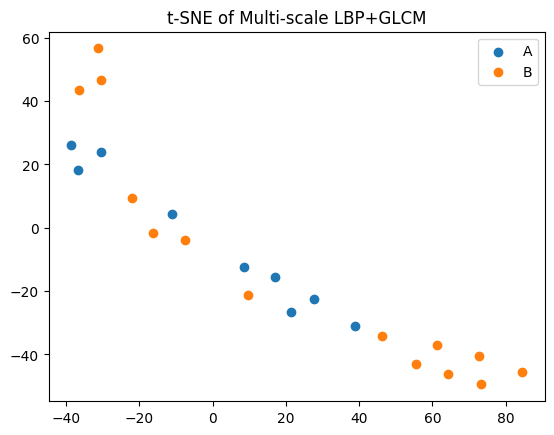

In [97]:
from sklearn.manifold import TSNE

X_tsne = TSNE(
    n_components=2,
    perplexity=5,   # small dataset → small perplexity
    random_state=42
).fit_transform(X)

plt.scatter(X_tsne[labels==0,0], X_tsne[labels==0,1], label='A')
plt.scatter(X_tsne[labels==1,0], X_tsne[labels==1,1], label='B')
plt.legend()
plt.title("t-SNE of Multi-scale LBP+GLCM")
plt.show()

In [115]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

clf = LogisticRegression(C=0.05, max_iter=500)
scores = cross_val_score(clf, X_small, y, cv=5)

print("Accuracy:", scores.mean(), "±", scores.std())


Accuracy: 0.95 ± 0.09999999999999999


In [118]:
from sklearn.model_selection import LeaveOneOut, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(
        C=0.05,
        max_iter=500,
        class_weight='balanced'
    ))
])

loo = LeaveOneOut()
y_pred = cross_val_predict(pipe, X_small, y, cv=loo)

print(classification_report(y, y_pred))

from sklearn.metrics import confusion_matrix, balanced_accuracy_score

print("Balanced accuracy:", balanced_accuracy_score(y, y_pred))
print(confusion_matrix(y, y_pred))

              precision    recall  f1-score   support

     bainite       0.75      1.00      0.86         9
  martensite       1.00      0.79      0.88        14

    accuracy                           0.87        23
   macro avg       0.88      0.89      0.87        23
weighted avg       0.90      0.87      0.87        23

Balanced accuracy: 0.8928571428571428
[[ 9  0]
 [ 3 11]]


AssertionError: Feature count mismatch!

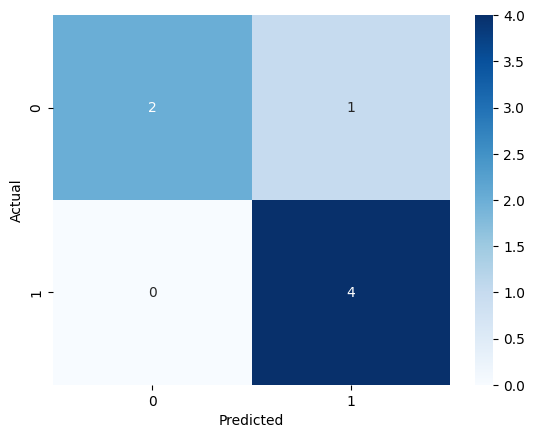

In [78]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get unique class names from labels
class_names = np.unique(labels)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=class_names)

# Plot
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


In [126]:
from sklearn.model_selection import LeaveOneOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import pandas as pd
import numpy as np

# ---------------------------
# 0️⃣ Ensure X_small and y exist
# ---------------------------
# X_small: shape (n_samples, n_features)
# y: array-like of labels
# lbp_scales: list of (radius, n_points)
# histograms: your dict of class features
# ---------------------------

feature_names = []

# 1️⃣ Intensity features
n_intensity = 5
intensity_names = ['intensity_mean', 'intensity_std', 'intensity_entropy', 'intensity_energy', 'intensity_skew']
feature_names.extend(intensity_names)

# 2️⃣ LBP features
lbp_stat_names = ['mean', 'std', 'entropy', 'energy', 'skew']
n_scales = len(lbp_scales)
for i, (radius, n_points) in enumerate(lbp_scales):
    scale_name = f'lbp_r{radius}_p{n_points}'
    for stat in lbp_stat_names:
        feature_names.append(f'{scale_name}_{stat}')

# 3️⃣ GLCM features
glcm_vec_example = histograms[list(histograms.keys())[0]]['glcm_features'][0]
n_glcm = len(glcm_vec_example)
glcm_names = [f'glcm_{i}' for i in range(n_glcm)]
feature_names.extend(glcm_names)

# Final check
assert len(feature_names) == X_small.shape[1], f"Feature count mismatch! {len(feature_names)} vs {X_small.shape[1]}"
print(f"Feature names generated correctly: {len(feature_names)} features")

# ---------------------------
# 2️⃣ LOOCV: collect coefficients
# ---------------------------
loo = LeaveOneOut()
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(
        C=0.05,
        class_weight='balanced',
        max_iter=500
    ))
])

coefs = []

for train_idx, _ in loo.split(X_small):
    pipe.fit(X_small[train_idx], y[train_idx])
    coefs.append(pipe.named_steps['clf'].coef_[0])

coefs = np.vstack(coefs)  # shape: (n_samples, n_features)

# ---------------------------
# 3️⃣ Compute stability metrics
# ---------------------------
coef_mean = coefs.mean(axis=0)
coef_std = coefs.std(axis=0)
sign_consistency = np.mean(np.sign(coefs) == np.sign(coef_mean), axis=0)
stability_ratio = np.abs(coef_mean) / (coef_std + 1e-6)

# ---------------------------
# 4️⃣ Build DataFrame
# ---------------------------
df_features = pd.DataFrame({
    'feature': feature_names,
    'coef_mean': coef_mean,
    'coef_std': coef_std,
    'sign_consistency': sign_consistency,
    'stability_ratio': stability_ratio
})

# Optional: group features
def feature_group(name):
    if name.startswith('intensity'):
        return 'Intensity'
    elif name.startswith('lbp'):
        return 'LBP'
    elif name.startswith('glcm'):
        return 'GLCM'
    else:
        return 'Other'

df_features['group'] = df_features['feature'].apply(feature_group)

# Sort by stability_ratio for importance
df_features = df_features.sort_values('stability_ratio', ascending=False)

# ---------------------------
# 5️⃣ Output
# ---------------------------
print("Top features by stability ratio:")
print(df_features.head(20))

# Summary by group
group_summary = df_features.groupby('group')['stability_ratio'].mean()
print("\nMean stability ratio by feature group:")
print(group_summary)


Feature names generated correctly: 36 features
Top features by stability ratio:
               feature  coef_mean  coef_std  sign_consistency  \
2    intensity_entropy  -0.215499  0.004267               1.0   
1        intensity_std  -0.280593  0.006719               1.0   
4       intensity_skew   0.195058  0.005872               1.0   
3     intensity_energy   0.182788  0.007769               1.0   
28   lbp_r5_p40_energy   0.050350  0.003011               1.0   
23   lbp_r4_p32_energy   0.036874  0.002725               1.0   
27  lbp_r5_p40_entropy  -0.059431  0.004435               1.0   
22  lbp_r4_p32_entropy  -0.041916  0.003983               1.0   
18   lbp_r3_p24_energy   0.025576  0.002758               1.0   
19     lbp_r3_p24_skew  -0.047947  0.005830               1.0   
17  lbp_r3_p24_entropy  -0.023475  0.003548               1.0   
25     lbp_r5_p40_mean   0.032229  0.005141               1.0   
34              glcm_4  -0.041681  0.006927               1.0   
14     lbp

In [127]:
df_features.groupby('group')['stability_ratio'].mean()


group
GLCM          3.265941
Intensity    30.029945
LBP           5.205900
Name: stability_ratio, dtype: float64

In [ ]:
lbp_scales = [
    (1, 8),   # fine texture
    (2, 16),  # medium texture
    (3, 24)   # coarse texture
]

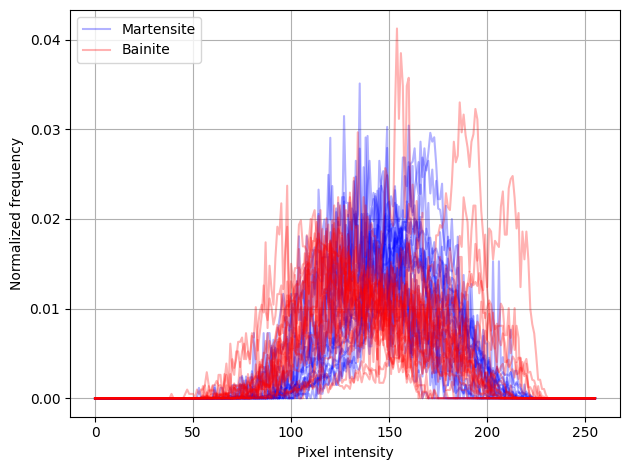

In [37]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Path to directory containing json + png files
data_dir = "data_labeling/src/results/felzenszwalb_c92203533e9f/"

# Storage for histograms
histograms = {
    "martensite": [],
    "bainite": []
}

# Loop over all JSON files
for filename in os.listdir(data_dir):
    if not filename.endswith(".json"):
        continue

    json_path = os.path.join(data_dir, filename)

    # Load JSON
    with open(json_path, "r") as f:
        meta = json.load(f)

    label = meta["label"].lower()  # martensite / bainite

    # Corresponding image file
    image_name = filename.replace(".json", ".png")
    image_path = os.path.join(data_dir, image_name)

    if not os.path.exists(image_path):
        print(f"Missing image for {filename}")
        continue

    # Load image and convert to grayscale
    img = Image.open(image_path).convert("L")
    img_np = np.array(img)

    # Compute normalized histogram
    hist, _ = np.histogram(
        img_np.flatten(),
        bins=256,
        range=(1, 256),
        density=True
    )

    # Store histogram
    if label in histograms:
        histograms[label].append(hist)
    else:
        print(f"Unknown label: {label}")

# ------------------ PLOTTING ------------------

# plt.figure(figsize=(10, 6))

# Plot martensite histograms
for hist in histograms["martensite"][:20]:
    plt.plot(
        hist,
        color="blue",
        alpha=0.3,
        label="Martensite"
        if "Martensite" not in plt.gca().get_legend_handles_labels()[1]
        else ""
    )

# Plot bainite histograms
for hist in histograms["bainite"][:20]:
    plt.plot(
        hist,
        color="red",
        alpha=0.3,
        label="Bainite"
        if "Bainite" not in plt.gca().get_legend_handles_labels()[1]
        else ""
    )

# plt.title("Grayscale Histograms of Martensite and Bainite Segments")
plt.xlabel("Pixel intensity")
plt.ylabel("Normalized frequency")
plt.legend(loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [8]:
import os
import numpy as np
from skimage import io, segmentation, measure
from skimage.util import img_as_ubyte

input_dir = "output_segments"
output_dir = "felzenszwalb_large3"
os.makedirs(output_dir, exist_ok=True)

min_segment_area = 700  # minimum connected component size from Felzenszwalb
min_crop_size = 200      # minimum width and height of cropped image to keep
padding = 10

def is_black_image(img, threshold=10):
    # Return True if the image is mostly black
    # For color images, check all channels; for grayscale, check single channel
    if img.ndim == 3:
        return np.max(img) < threshold
    else:
        return np.max(img) < threshold

for filename in os.listdir(input_dir):
    if filename.lower().endswith((".png", ".jpg", ".jpeg")):
        filepath = os.path.join(input_dir, filename)
        image = io.imread(filepath)

        segments = segmentation.felzenszwalb(image, scale=700, min_size=700)

        parts = filename.split("_")
        label = parts[-2].lower()
        print(f"Processing {filename}, label: {label}")

        for seg_val in np.unique(segments):
            segment_mask = segments == seg_val

            labeled_cc, num_cc = measure.label(segment_mask, connectivity=2, return_num=True)
            
            for cc_val in range(1, num_cc + 1):
                cc_mask = labeled_cc == cc_val
                if np.sum(cc_mask) < min_segment_area:
                    continue

                coords = np.argwhere(cc_mask)
                y0, x0 = coords.min(axis=0)
                y1, x1 = coords.max(axis=0) + 1

                y0 = max(y0 - padding, 0)
                x0 = max(x0 - padding, 0)
                y1 = min(y1 + padding, image.shape[0])
                x1 = min(x1 + padding, image.shape[1])

                cropped = np.zeros_like(image[y0:y1, x0:x1])
                if image.ndim == 3:
                    for c in range(image.shape[2]):
                        cropped[..., c] = image[y0:y1, x0:x1, c] * cc_mask[y0:y1, x0:x1]
                else:
                    cropped = image[y0:y1, x0:x1] * cc_mask[y0:y1, x0:x1]

                # Check size
                height, width = cropped.shape[:2]
                if height < min_crop_size or width < min_crop_size:
                    continue

                # Check if image is mostly black
                if is_black_image(cropped):
                    continue

                output_filename = f"{os.path.splitext(filename)[0]}_{label}_seg{seg_val}_cc{cc_val}.png"
                output_path = os.path.join(output_dir, output_filename)
                io.imsave(output_path, img_as_ubyte(cropped))


Processing 797-DQ-full_1000x-1_bainite_1.png, label: bainite
Processing 797-DQ-full_1000x-1_bainite_2.png, label: bainite
Processing 797-DQ-full_1000x-1_bainite_3.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_bainite_3_bainite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_bainite_3_bainite_seg9_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_bainite_4.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_bainite_4_bainite_seg0_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_bainite_4_bainite_seg5_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_bainite_4_bainite_seg26_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_martensite_1.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_1_martensite_seg5_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_martensite_2.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_2_martensite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_2_martensite_seg3_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_2_martensite_seg5_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_2_martensite_seg10_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_martensite_3.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_3_martensite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_3_martensite_seg4_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_martensite_4.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_4_martensite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_4_martensite_seg3_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-1_martensite_5.png, label: martensite
Processing 797-DQ-full_1000x-1_martensite_6.png, label: martensite
Processing 797-DQ-full_1000x-1_martensite_7.png, label: martensite
Processing 797-DQ-full_1000x-1_martensite_8.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-1_martensite_8_martensite_seg2_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_bainite_1.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_1_bainite_seg6_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_bainite_2.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_2_bainite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_bainite_3.png, label: bainite
Processing 797-DQ-full_1000x-2_bainite_4.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_4_bainite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_4_bainite_seg5_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_4_bainite_seg16_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_4_bainite_seg19_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_bainite_5.png, label: bainite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_bainite_5_bainite_seg3_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_martensite_1.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_1_martensite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_martensite_2.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_2_martensite_seg1_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_2_martensite_seg3_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_martensite_3.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_3_martensite_seg9_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_martensite_4.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_4_martensite_seg2_cc1.png is a low contrast image
  return func(*args, **kwargs)
c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_4_martensite_seg6_cc1.png is a low contrast image
  return func(*args, **kwargs)


Processing 797-DQ-full_1000x-2_martensite_5.png, label: martensite


c:\Users\hallo\Desktop\Bainitu_segmenation\venv\lib\site-packages\skimage\_shared\utils.py:328: UserWarning: felzenszwalb_large3\797-DQ-full_1000x-2_martensite_5_martensite_seg2_cc1.png is a low contrast image
  return func(*args, **kwargs)


KeyboardInterrupt: 